 <p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Bakery Sales Prediction based on Weather</p> <br>
<p style="font-family: Arial; font-size:1.5em;color:purple; font-style:bold">
Given: </p>
<ul>
<li><p style="font-family: Arial; font-size:1em;color:black; font-style:bold">
Sales record of four different items in period from 2013 to 2019</p>
<li><p style="font-family: Arial; font-size:1em;color:black; font-style:bold">
Weather data from 2013 to 2019
</p> 
</ul>
<p style="font-family: Arial; font-size:1.5em;color:purple; font-style:bold">
Task: 
<ul>
    <li><p style="font-family: Arial; font-size:1em;color:black; font-style:bold">
      Predict the sales for a given day, depending on the weather conditions.  
</ul>
</p>
<br>

In [1]:
%cd D:\CAU Kiel\Deep Learning with TensorFlow\Data Sales Prediction Project\Jupyter Notebook\Data

D:\CAU Kiel\Deep Learning with TensorFlow\Data Sales Prediction Project\Jupyter Notebook\Data


In [2]:
from fbprophet import Prophet

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Importing required libraries</p>

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import seaborn as sns
import os
from sklearn.preprocessing import MinMaxScaler
from scipy import stats
from statsmodels.tsa.stattools import adfuller
from sklearn import preprocessing
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
import warnings
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric
import math
warnings.filterwarnings('ignore')
from statsmodels.tsa.stattools import pacf
import datetime
%matplotlib inline

In [61]:
%load_ext tensorboard
!rm -rf ./logs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [4]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [5]:
def plot_series(time, series, format="-", start=0, end=None):
    plt.plot(time[start:end], series[start:end], format)
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.grid(True)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Loading the data into Pandas Dataframes</p>

In [6]:
df = pd.read_csv('umsatzdaten_gekuerzt.csv')
kiwo = pd.read_csv('kiwo.csv')
weather = pd.read_csv('wetter.csv')

In [7]:
df['Datum']=pd.to_datetime(df['Datum']) 
kiwo['Datum']=pd.to_datetime(kiwo['Datum']) 
weather['Datum']=pd.to_datetime(weather['Datum']) 

In [8]:
kiwo.columns = ['Date', 'KielerWoche']
weather.columns = ['Date', 'Bewoelkung', 'Temperatur', 'Windgeschwindigkeit','Wettercode']
df.columns = ['Date', 'Warengruppe', 'Umsatz']

In [9]:
kiwo.head()

,Date,KielerWoche
0,2013-06-22,1
1,2013-06-23,1
2,2013-06-24,1
3,2013-06-25,1
4,2013-06-26,1


In [10]:
df.head()

,Date,Warengruppe,Umsatz
0,2013-07-01,1,148.828353
1,2013-07-02,1,159.793757
2,2013-07-03,1,111.885594
3,2013-07-04,1,168.864941
4,2013-07-05,1,171.280754


In [11]:
weather.head()

,Date,Bewoelkung,Temperatur,Windgeschwindigkeit,Wettercode
0,2012-01-01,8.0,9.8250,14,58.0
1,2012-01-02,7.0,7.4375,12,NaN
2,2012-01-03,8.0,5.5375,18,63.0
3,2012-01-04,4.0,5.6875,19,80.0
4,2012-01-05,6.0,5.3000,23,80.0


In [12]:
df.head()

,Date,Warengruppe,Umsatz
0,2013-07-01,1,148.828353
1,2013-07-02,1,159.793757
2,2013-07-03,1,111.885594
3,2013-07-04,1,168.864941
4,2013-07-05,1,171.280754


In [13]:
df = df.merge(weather[['Date','Bewoelkung','Temperatur','Windgeschwindigkeit']])
df = df.join(kiwo.set_index('Date'), on='Date')
df['KielerWoche'] = df['KielerWoche'].fillna(0)


In [14]:
df['year'] = df['Date'].apply(lambda x: x.year)
df['quarter'] = df['Date'].apply(lambda x: x.quarter)
df['month'] = df['Date'].apply(lambda x: x.month)
df['day'] = df['Date'].apply(lambda x: x.day)

In [15]:
df["weekday"]=df.apply(lambda row: row["Date"].weekday(),axis=1)
df["weekday"] = (df["weekday"] < 5).astype(int)

In [16]:
df2 = df[df['Warengruppe'] == 2][['Date','Umsatz']]

In [17]:
df.index = pd.to_datetime(df.Date)

In [18]:
df2.head()

,Date,Umsatz
1,2013-07-01,535.856285
6,2013-07-02,546.780787
11,2013-07-03,427.343259
16,2013-07-04,454.859641
21,2013-07-05,492.818804


In [19]:
df.shape

(10788, 12)

In [20]:
print('Number of rows and columns:', df.shape)
print('The time series starts from: ', df.index.min())
print('The time series ends on: ', df.index.max())

Number of rows and columns: (10788, 12)
The time series starts from:  2013-07-01 00:00:00
The time series ends on:  2019-05-31 00:00:00


In [21]:
df = df.dropna()

In [22]:
dataset = df.drop(labels = 'Date', axis = 1)

In [23]:
columns = dataset.columns

In [24]:
dataset[columns] = dataset[columns].round(1)

In [25]:
dataset

,Warengruppe,Umsatz,Bewoelkung,Temperatur,Windgeschwindigkeit,KielerWoche,year,quarter,month,day,weekday
Date,,,,,,,,,,,
2013-07-01,1,148.8,6.0,17.8,15,0.0,2013,3,7,1,1
2013-07-01,2,535.9,6.0,17.8,15,0.0,2013,3,7,1,1
2013-07-01,3,201.2,6.0,17.8,15,0.0,2013,3,7,1,1
2013-07-01,4,65.9,6.0,17.8,15,0.0,2013,3,7,1,1
2013-07-01,5,317.5,6.0,17.8,15,0.0,2013,3,7,1,1
2013-07-02,1,159.8,3.0,17.3,10,0.0,2013,3,7,2,1
2013-07-02,2,546.8,3.0,17.3,10,0.0,2013,3,7,2,1
2013-07-02,3,265.3,3.0,17.3,10,0.0,2013,3,7,2,1
2013-07-02,4,74.5,3.0,17.3,10,0.0,2013,3,7,2,1


In [26]:
dataset.head()

,Warengruppe,Umsatz,Bewoelkung,Temperatur,Windgeschwindigkeit,KielerWoche,year,quarter,month,day,weekday
Date,,,,,,,,,,,
2013-07-01,1,148.8,6.0,17.8,15,0.0,2013,3,7,1,1
2013-07-01,2,535.9,6.0,17.8,15,0.0,2013,3,7,1,1
2013-07-01,3,201.2,6.0,17.8,15,0.0,2013,3,7,1,1
2013-07-01,4,65.9,6.0,17.8,15,0.0,2013,3,7,1,1
2013-07-01,5,317.5,6.0,17.8,15,0.0,2013,3,7,1,1


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Splitting the data into 6 groups, for Six individual items</p>

In [27]:
G1 = dataset[dataset['Warengruppe'] == 1]
G2 = dataset[dataset['Warengruppe'] == 2]
G3 = dataset[dataset['Warengruppe'] == 3]
G4 = dataset[dataset['Warengruppe'] == 4]
G5 = dataset[dataset['Warengruppe'] == 5]
G6 = dataset[dataset['Warengruppe'] == 6]

In [28]:
G1.isna().any()

Warengruppe            False
Umsatz                 False
Bewoelkung             False
Temperatur             False
Windgeschwindigkeit    False
KielerWoche            False
year                   False
quarter                False
month                  False
day                    False
weekday                False
dtype: bool

In [29]:
G1 = G1.drop('Warengruppe',axis = 1)
G2 = G2.drop('Warengruppe',axis = 1)
G3 = G3.drop('Warengruppe',axis = 1)
G4 = G4.drop('Warengruppe',axis = 1)
G5 = G5.drop('Warengruppe',axis = 1)
G6 = G6.drop('Warengruppe',axis = 1)

In [30]:
 G1.head()

,Umsatz,Bewoelkung,Temperatur,Windgeschwindigkeit,KielerWoche,year,quarter,month,day,weekday
Date,,,,,,,,,,
2013-07-01,148.8,6.0,17.8,15,0.0,2013,3,7,1,1
2013-07-02,159.8,3.0,17.3,10,0.0,2013,3,7,2,1
2013-07-03,111.9,7.0,21.1,6,0.0,2013,3,7,3,1
2013-07-04,168.9,7.0,18.8,7,0.0,2013,3,7,4,1
2013-07-05,171.3,5.0,20.0,12,0.0,2013,3,7,5,1


In [31]:
G1

,Umsatz,Bewoelkung,Temperatur,Windgeschwindigkeit,KielerWoche,year,quarter,month,day,weekday
Date,,,,,,,,,,
2013-07-01,148.8,6.0,17.8,15,0.0,2013,3,7,1,1
2013-07-02,159.8,3.0,17.3,10,0.0,2013,3,7,2,1
2013-07-03,111.9,7.0,21.1,6,0.0,2013,3,7,3,1
2013-07-04,168.9,7.0,18.8,7,0.0,2013,3,7,4,1
2013-07-05,171.3,5.0,20.0,12,0.0,2013,3,7,5,1
2013-07-06,174.6,0.0,19.0,8,0.0,2013,3,7,6,0
2013-07-07,92.6,0.0,21.4,9,0.0,2013,3,7,7,0
2013-07-08,135.5,0.0,22.7,10,0.0,2013,3,7,8,1
2013-07-09,136.0,0.0,23.3,8,0.0,2013,3,7,9,1


In [32]:
G1.iloc[-30]

Umsatz                  189.3
Bewoelkung                7.0
Temperatur                9.0
Windgeschwindigkeit      16.0
KielerWoche               0.0
year                   2019.0
quarter                   2.0
month                     5.0
day                       2.0
weekday                   1.0
Name: 2019-05-02 00:00:00, dtype: float64

In [33]:
G1.iloc[2060]

Umsatz                  189.3
Bewoelkung                7.0
Temperatur                9.0
Windgeschwindigkeit      16.0
KielerWoche               0.0
year                   2019.0
quarter                   2.0
month                     5.0
day                       2.0
weekday                   1.0
Name: 2019-05-02 00:00:00, dtype: float64

In [34]:
dataset_G2 = G2.Umsatz.values #numpy.ndarray
dataset_G2 = dataset_G2.astype('float32')
dataset_G2 = np.reshape(dataset_G2, (-1, 1))
scaler = MinMaxScaler(feature_range=(0, 1))
dataset_G2 = scaler.fit_transform(dataset_G2)
train_size_G2 = 1686
test_size_G2 = len(dataset_G2) - train_size_G2
train_G2, test_G2 = dataset_G2[0:train_size_G2,:], dataset_G2[train_size_G2:len(dataset_G2),:]

In [35]:
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=30):
    X, Y = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        X.append(a)
        Y.append(dataset[i + look_back, 0])
    return np.array(X), np.array(Y)

In [36]:
# reshape into X=t and Y=t+1
look_back = 30
X_train_G2, Y_train_G2 = create_dataset(train_G2, look_back)
X_test_G2, Y_test_G2 = create_dataset(test_G2, look_back)

In [37]:
X_train_G2.shape

(1655, 30)

In [38]:
Y_train_G2.shape

(1655,)

In [39]:

# reshape input to be [samples, time steps, features]
X_train_G2 = np.reshape(X_train_G2, (X_train_G2.shape[0], 1, X_train_G2.shape[1]))
X_test_G2 = np.reshape(X_test_G2, (X_test_G2.shape[0], 1, X_test_G2.shape[1]))

In [40]:
X_train_G2.shape

(1655, 1, 30)

In [41]:
model_G2 = tf.keras.models.Sequential([
  
  tf.keras.layers.LSTM(100, input_shape=(X_train_G2.shape[1], X_train_G2.shape[2])),
  tf.keras.layers.LeakyReLU(alpha = 0.5),
  tf.keras.layers.Dropout(0.1),
  tf.keras.layers.Dense(1),
])


model_G2.compile(loss='mse',
              optimizer='ADAM',
              metrics=["mae"],
             lr = 5e-5,
             momentum = 0.9)

#callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=100)]
history_G2 = model_G2.fit(X_train_G2, Y_train_G2, epochs=200, batch_size=70, validation_data=(X_test_G2, Y_test_G2), 
                     verbose=1, shuffle=False)
model_G2.summary()

Train on 1655 samples, validate on 373 samples
Epoch 1/200
1655/1655 [==============================] - 3s 2ms/sample - loss: 0.0379 - mae: 0.1426 - val_loss: 0.0119 - val_mae: 0.0923
Epoch 2/200
1655/1655 [==============================] - 0s 56us/sample - loss: 0.0119 - mae: 0.0892 - val_loss: 0.0099 - val_mae: 0.0779
Epoch 3/200
1655/1655 [==============================] - 0s 55us/sample - loss: 0.0102 - mae: 0.0787 - val_loss: 0.0092 - val_mae: 0.0773
Epoch 4/200
1655/1655 [==============================] - 0s 53us/sample - loss: 0.0096 - mae: 0.0774 - val_loss: 0.0087 - val_mae: 0.0740
Epoch 5/200
1655/1655 [==============================] - 0s 54us/sample - loss: 0.0090 - mae: 0.0744 - val_loss: 0.0083 - val_mae: 0.0719
Epoch 6/200
1655/1655 [==============================] - 0s 54us/sample - loss: 0.0084 - mae: 0.0714 - val_loss: 0.0078 - val_mae: 0.0692
Epoch 7/200
1655/1655 [==============================] - 0s 52us/sample - loss: 0.0079 - mae: 0.0683 - val_loss: 0.0074 - val_

1655/1655 [==============================] - 0s 54us/sample - loss: 0.0044 - mae: 0.0457 - val_loss: 0.0047 - val_mae: 0.0498
Epoch 60/200
1655/1655 [==============================] - 0s 52us/sample - loss: 0.0044 - mae: 0.0460 - val_loss: 0.0047 - val_mae: 0.0497
Epoch 61/200
1655/1655 [==============================] - 0s 52us/sample - loss: 0.0044 - mae: 0.0450 - val_loss: 0.0046 - val_mae: 0.0495
Epoch 62/200
1655/1655 [==============================] - 0s 52us/sample - loss: 0.0044 - mae: 0.0454 - val_loss: 0.0046 - val_mae: 0.0496
Epoch 63/200
1655/1655 [==============================] - 0s 64us/sample - loss: 0.0043 - mae: 0.0452 - val_loss: 0.0046 - val_mae: 0.0493
Epoch 64/200
1655/1655 [==============================] - 0s 63us/sample - loss: 0.0043 - mae: 0.0451 - val_loss: 0.0046 - val_mae: 0.0493
Epoch 65/200
1655/1655 [==============================] - 0s 63us/sample - loss: 0.0043 - mae: 0.0449 - val_loss: 0.0046 - val_mae: 0.0495
Epoch 66/200
1655/1655 [================

Epoch 118/200
1655/1655 [==============================] - 0s 54us/sample - loss: 0.0040 - mae: 0.0430 - val_loss: 0.0043 - val_mae: 0.0472
Epoch 119/200
1655/1655 [==============================] - 0s 55us/sample - loss: 0.0039 - mae: 0.0429 - val_loss: 0.0043 - val_mae: 0.0473
Epoch 120/200
1655/1655 [==============================] - 0s 60us/sample - loss: 0.0039 - mae: 0.0434 - val_loss: 0.0043 - val_mae: 0.0471
Epoch 121/200
1655/1655 [==============================] - 0s 57us/sample - loss: 0.0039 - mae: 0.0430 - val_loss: 0.0043 - val_mae: 0.0471
Epoch 122/200
1655/1655 [==============================] - 0s 54us/sample - loss: 0.0039 - mae: 0.0431 - val_loss: 0.0043 - val_mae: 0.0471
Epoch 123/200
1655/1655 [==============================] - 0s 57us/sample - loss: 0.0039 - mae: 0.0432 - val_loss: 0.0042 - val_mae: 0.0468
Epoch 124/200
1655/1655 [==============================] - 0s 57us/sample - loss: 0.0039 - mae: 0.0429 - val_loss: 0.0042 - val_mae: 0.0468
Epoch 125/200
1655/1

1655/1655 [==============================] - 0s 52us/sample - loss: 0.0036 - mae: 0.0417 - val_loss: 0.0041 - val_mae: 0.0455
Epoch 177/200
1655/1655 [==============================] - 0s 48us/sample - loss: 0.0036 - mae: 0.0412 - val_loss: 0.0041 - val_mae: 0.0456
Epoch 178/200
1655/1655 [==============================] - 0s 49us/sample - loss: 0.0036 - mae: 0.0416 - val_loss: 0.0041 - val_mae: 0.0457
Epoch 179/200
1655/1655 [==============================] - 0s 52us/sample - loss: 0.0037 - mae: 0.0424 - val_loss: 0.0041 - val_mae: 0.0456
Epoch 180/200
1655/1655 [==============================] - 0s 51us/sample - loss: 0.0035 - mae: 0.0415 - val_loss: 0.0041 - val_mae: 0.0456
Epoch 181/200
1655/1655 [==============================] - 0s 51us/sample - loss: 0.0037 - mae: 0.0418 - val_loss: 0.0041 - val_mae: 0.0459
Epoch 182/200
1655/1655 [==============================] - 0s 55us/sample - loss: 0.0037 - mae: 0.0417 - val_loss: 0.0041 - val_mae: 0.0455
Epoch 183/200
1655/1655 [=========

In [42]:
# make predictions
train_predict_G2 = model_G2.predict(X_train_G2)
test_predict_G2 = model_G2.predict(X_test_G2)
# invert predictions
train_predict_G2 = scaler.inverse_transform(train_predict_G2)
Y_train_G2 = scaler.inverse_transform([Y_train_G2])
test_predict_G2 = scaler.inverse_transform(test_predict_G2)
Y_test_G2 = scaler.inverse_transform([Y_test_G2])



In [43]:
print('Train Mean Absolute Error:', mean_absolute_error(Y_train_G2[0], train_predict_G2[:,0]))
print('Train Root Mean Squared Error:',np.sqrt(mean_squared_error(Y_train_G2[0], train_predict_G2[:,0])))
print('Train Mean Absolute Percentage Error:', tf.keras.losses.MAPE(Y_train_G2[0], train_predict_G2[:,0]))
print('Test Mean Absolute Error:', mean_absolute_error(Y_test_G2[0], test_predict_G2[:,0]))
print('Test Root Mean Squared Error:',np.sqrt(mean_squared_error(Y_test_G2[0], test_predict_G2[:,0])))
print('Test Mean Absolute Percentage Error:', tf.keras.losses.MAPE(Y_test_G2[0], test_predict_G2[:,0]))

Train Mean Absolute Error: 39.77021484796297
Train Root Mean Squared Error: 58.49235810804231
Train Mean Absolute Percentage Error: tf.Tensor(10.247535, shape=(), dtype=float32)
Test Mean Absolute Error: 46.72684774549101
Test Root Mean Squared Error: 65.37110581543617
Test Mean Absolute Percentage Error: tf.Tensor(12.042223, shape=(), dtype=float32)


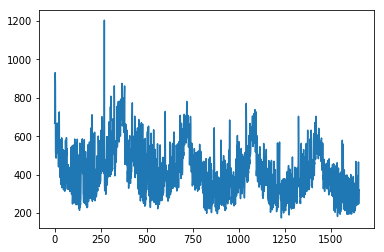

In [44]:
plt.plot(Y_train_G2[0])

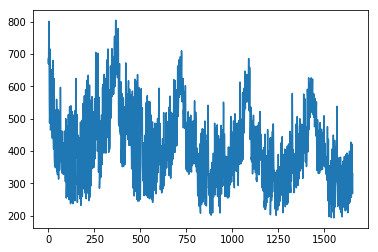

In [45]:
plt.plot(train_predict_G2[:,0])

In [46]:
train_predict_G2[:,0]

array([684.0407 , 669.352  , 696.5773 , ..., 299.30417, 268.50012,
       329.73666], dtype=float32)

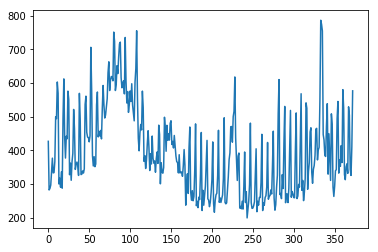

In [47]:
plt.plot(Y_test_G2[0])

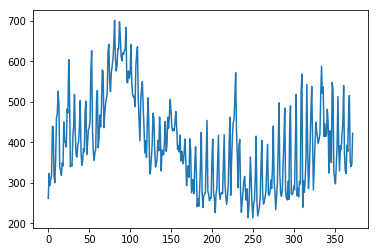

In [48]:
plt.plot(test_predict_G2[:,0])

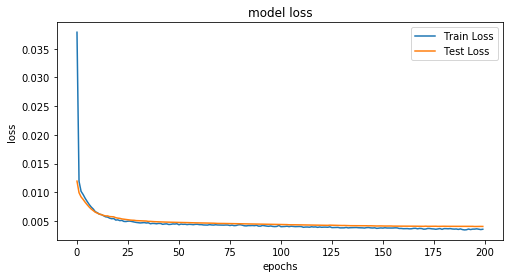

In [49]:
plt.figure(figsize=(8,4))
plt.plot(history_G2.history['loss'], label='Train Loss')
plt.plot(history_G2.history['val_loss'], label='Test Loss')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show();

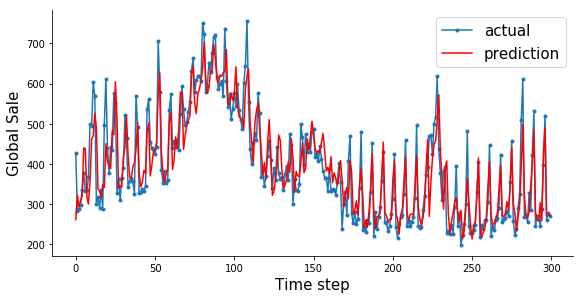

In [50]:
aa=[x for x in range(300)]
plt.figure(figsize=(8,4))
plt.plot(aa, Y_test_G2[0][:300], marker='.', label="actual")
plt.plot(aa, test_predict_G2[:,0][:300], 'r', label="prediction")
# plt.tick_params(left=False, labelleft=True) #remove ticks
plt.tight_layout()
sns.despine(top=True)
plt.subplots_adjust(left=0.07)
plt.ylabel('Global Sale', size=15)
plt.xlabel('Time step', size=15)
plt.legend(fontsize=15)
plt.show();

In [51]:
df2['Umsatz'] = df2['Umsatz'].round(1)

In [52]:
m = Prophet()

In [53]:
df2.columns = ['ds', 'y']

In [54]:
m.fit(df2)

I0219 14:40:51.883114  2216 forecaster.py:886] Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [55]:
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
2459,2020-05-26
2460,2020-05-27
2461,2020-05-28
2462,2020-05-29
2463,2020-05-30


In [56]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2459,2020-05-26,429.627846,343.760463,521.624523
2460,2020-05-27,425.876546,342.694672,509.875627
2461,2020-05-28,443.206830,358.952085,529.945720
2462,2020-05-29,449.010663,367.861680,536.099017
2463,2020-05-30,557.209053,472.916894,644.997870


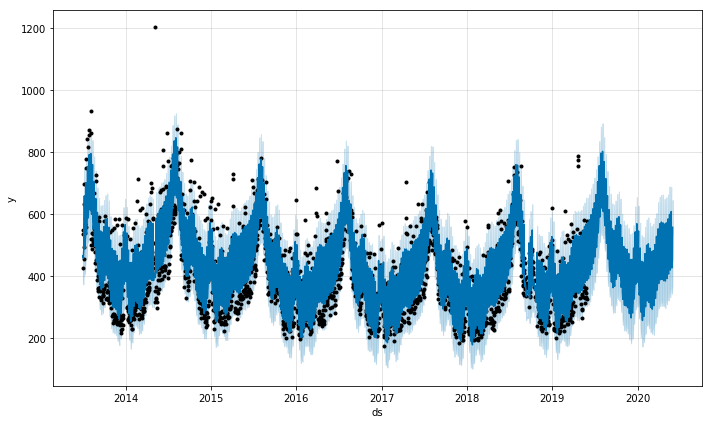

In [57]:
fig1 = m.plot(forecast)

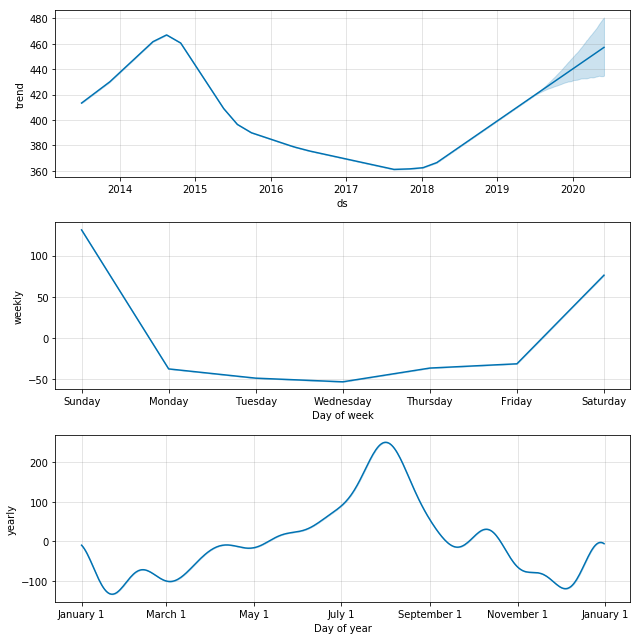

In [58]:
fig2 = m.plot_components(forecast)

In [59]:
df_cv = cross_validation(m, initial='1095 days', period='30 days', horizon = '365 days')
df_cv.head()

I0219 14:41:00.148911  2216 diagnostics.py:57] Making 24 forecasts with cutoffs between 2016-07-10 00:00:00 and 2018-05-31 00:00:00


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2016-07-11,462.225624,374.693976,554.106678,434.1,2016-07-10
1,2016-07-12,453.815496,364.688638,540.426173,442.5,2016-07-10
2,2016-07-13,459.894509,371.816503,543.727884,441.2,2016-07-10
3,2016-07-14,479.538999,395.041155,566.440072,477.9,2016-07-10
4,2016-07-15,496.073999,398.815344,585.992180,455.6,2016-07-10


In [62]:
df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,coverage
0,37 days,3087.222454,55.562779,40.650700,0.111788,0.904688
1,38 days,3059.928637,55.316622,40.474566,0.111628,0.905874
2,39 days,3242.200889,56.940327,41.246878,0.112895,0.901344
3,40 days,3288.274292,57.343476,41.562366,0.113182,0.901130
4,41 days,3412.754696,58.418787,42.144230,0.113722,0.897519


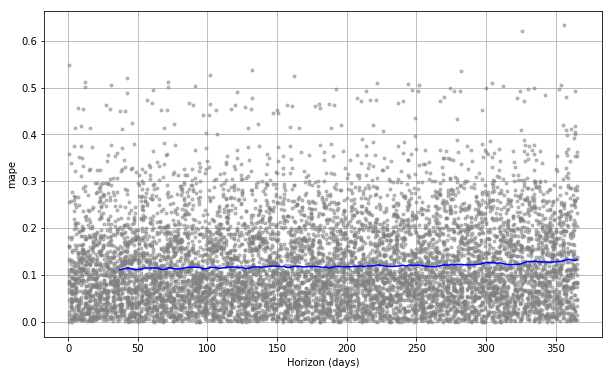

In [63]:
fig = plot_cross_validation_metric(df_cv, metric='mape')

In [64]:
df2.head()

,ds,y
1,2013-07-01,535.9
6,2013-07-02,546.8
11,2013-07-03,427.3
16,2013-07-04,454.9
21,2013-07-05,492.8


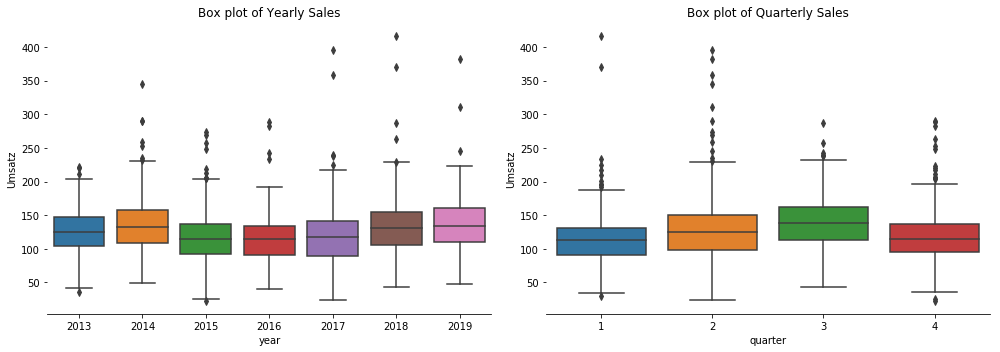

In [65]:
plt.figure(figsize=(14,5))
plt.subplot(1,2,1)
plt.subplots_adjust(wspace=0.2)
sns.boxplot(x="year", y="Umsatz", data=G1)
plt.xlabel('year')
plt.title('Box plot of Yearly Sales')
sns.despine(left=True)
plt.tight_layout()
plt.subplot(1,2,2)
sns.boxplot(x="quarter", y="Umsatz", data=G1)
plt.xlabel('quarter')
plt.title('Box plot of Quarterly Sales')
sns.despine(left=True)
plt.tight_layout();

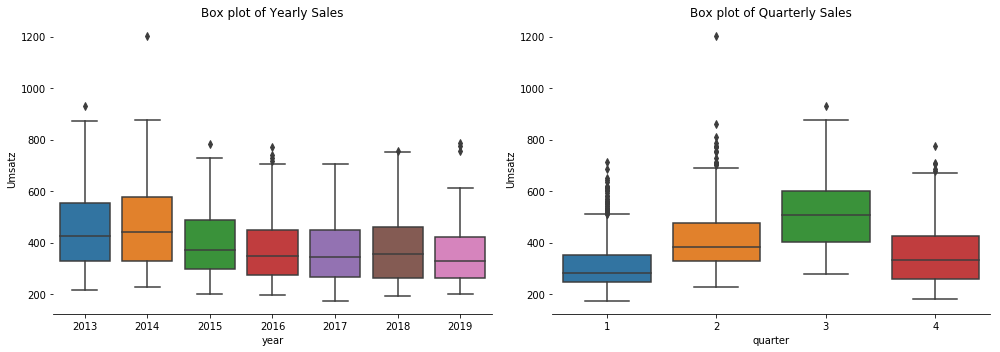

In [66]:
plt.figure(figsize=(14,5))
plt.subplot(1,2,1)
plt.subplots_adjust(wspace=0.2)
sns.boxplot(x="year", y="Umsatz", data=G2)
plt.xlabel('year')
plt.title('Box plot of Yearly Sales')
sns.despine(left=True)
plt.tight_layout()
plt.subplot(1,2,2)
sns.boxplot(x="quarter", y="Umsatz", data=G2)
plt.xlabel('quarter')
plt.title('Box plot of Quarterly Sales')
sns.despine(left=True)
plt.tight_layout();

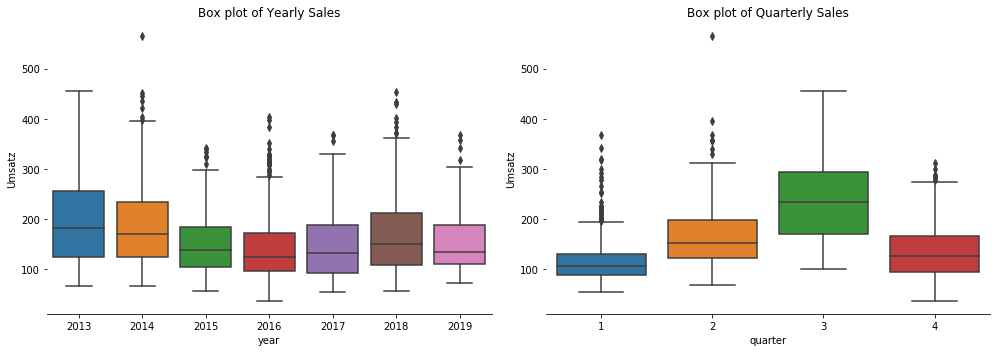

In [67]:
plt.figure(figsize=(14,5))
plt.subplot(1,2,1)
plt.subplots_adjust(wspace=0.2)
sns.boxplot(x="year", y="Umsatz", data=G3)
plt.xlabel('year')
plt.title('Box plot of Yearly Sales')
sns.despine(left=True)
plt.tight_layout()
plt.subplot(1,2,2)
sns.boxplot(x="quarter", y="Umsatz", data=G3)
plt.xlabel('quarter')
plt.title('Box plot of Quarterly Sales')
sns.despine(left=True)
plt.tight_layout();

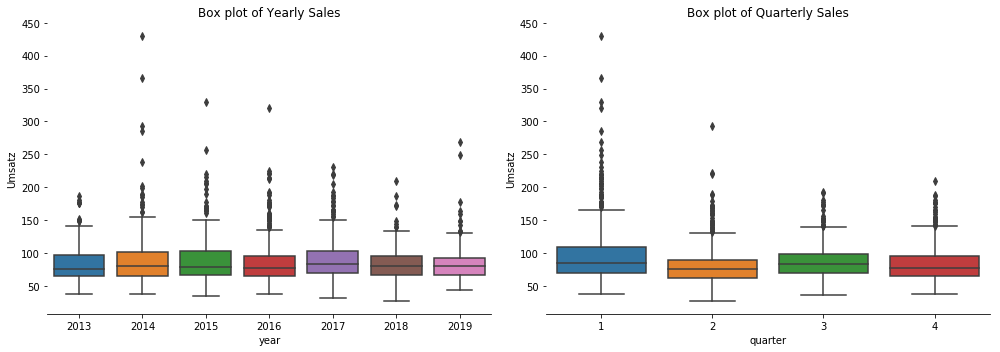

In [68]:
plt.figure(figsize=(14,5))
plt.subplot(1,2,1)
plt.subplots_adjust(wspace=0.2)
sns.boxplot(x="year", y="Umsatz", data=G4)
plt.xlabel('year')
plt.title('Box plot of Yearly Sales')
sns.despine(left=True)
plt.tight_layout()
plt.subplot(1,2,2)
sns.boxplot(x="quarter", y="Umsatz", data=G4)
plt.xlabel('quarter')
plt.title('Box plot of Quarterly Sales')
sns.despine(left=True)
plt.tight_layout();

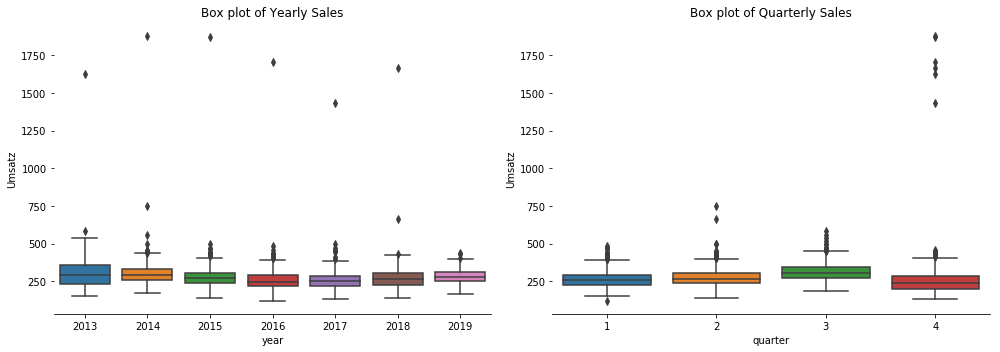

In [69]:
plt.figure(figsize=(14,5))
plt.subplot(1,2,1)
plt.subplots_adjust(wspace=0.2)
sns.boxplot(x="year", y="Umsatz", data=G5)
plt.xlabel('year')
plt.title('Box plot of Yearly Sales')
sns.despine(left=True)
plt.tight_layout()
plt.subplot(1,2,2)
sns.boxplot(x="quarter", y="Umsatz", data=G5)
plt.xlabel('quarter')
plt.title('Box plot of Quarterly Sales')
sns.despine(left=True)
plt.tight_layout();

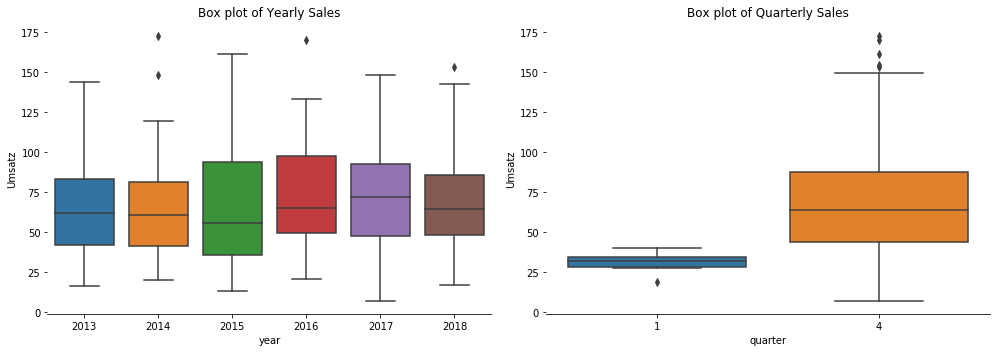

In [70]:
plt.figure(figsize=(14,5))
plt.subplot(1,2,1)
plt.subplots_adjust(wspace=0.2)
sns.boxplot(x="year", y="Umsatz", data=G6)
plt.xlabel('year')
plt.title('Box plot of Yearly Sales')
sns.despine(left=True)
plt.tight_layout()
plt.subplot(1,2,2)
sns.boxplot(x="quarter", y="Umsatz", data=G6)
plt.xlabel('quarter')
plt.title('Box plot of Quarterly Sales')
sns.despine(left=True)
plt.tight_layout();

,count,mean,std,min,25%,50%,75%,max
Umsatz,2090.0,124.250766,40.893937,23.1,98.125,121.7,146.675,416.8
Bewoelkung,2090.0,4.697129,2.657151,0.0,2.000,6.0,7.000,8.0
Temperatur,2090.0,11.984067,7.191955,-8.5,6.200,11.6,17.800,32.7
Windgeschwindigkeit,2090.0,11.038756,4.140187,3.0,8.000,10.0,13.000,35.0
KielerWoche,2090.0,0.021531,0.145181,0.0,0.000,0.0,0.000,1.0
year,2090.0,2015.931100,1.756078,2013.0,2014.000,2016.0,2017.000,2019.0
quarter,2090.0,2.500000,1.120440,1.0,1.000,3.0,3.000,4.0
month,2090.0,6.481818,3.457034,1.0,3.000,7.0,9.000,12.0
day,2090.0,15.792344,8.752374,1.0,8.000,16.0,23.000,31.0
weekday,2090.0,0.714833,0.451602,0.0,0.000,1.0,1.000,1.0


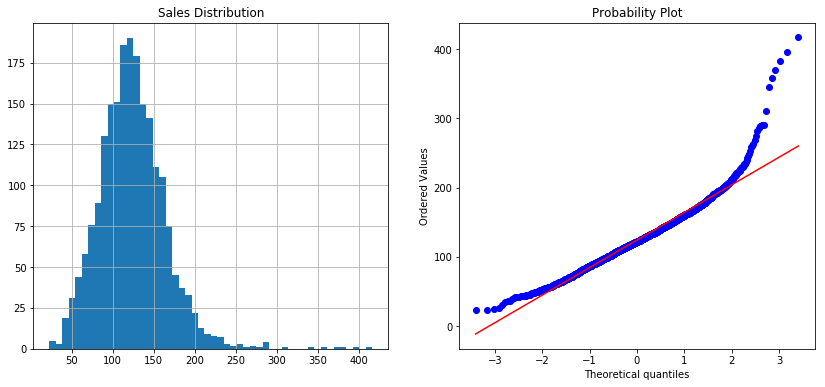

In [71]:
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
G1['Umsatz'].hist(bins=50)
plt.title('Sales Distribution')
plt.subplot(1,2,2)
stats.probplot(G1['Umsatz'], plot=plt);
G1.describe().T

,count,mean,std,min,25%,50%,75%,max
Umsatz,2090.0,398.842105,137.425531,175.0,286.5,367.7,485.825,1203.4
Bewoelkung,2090.0,4.697129,2.657151,0.0,2.0,6.0,7.000,8.0
Temperatur,2090.0,11.984067,7.191955,-8.5,6.2,11.6,17.800,32.7
Windgeschwindigkeit,2090.0,11.038756,4.140187,3.0,8.0,10.0,13.000,35.0
KielerWoche,2090.0,0.021531,0.145181,0.0,0.0,0.0,0.000,1.0
year,2090.0,2015.931100,1.756078,2013.0,2014.0,2016.0,2017.000,2019.0
quarter,2090.0,2.500000,1.120440,1.0,1.0,3.0,3.000,4.0
month,2090.0,6.481818,3.457034,1.0,3.0,7.0,9.000,12.0
day,2090.0,15.792344,8.752374,1.0,8.0,16.0,23.000,31.0
weekday,2090.0,0.714833,0.451602,0.0,0.0,1.0,1.000,1.0


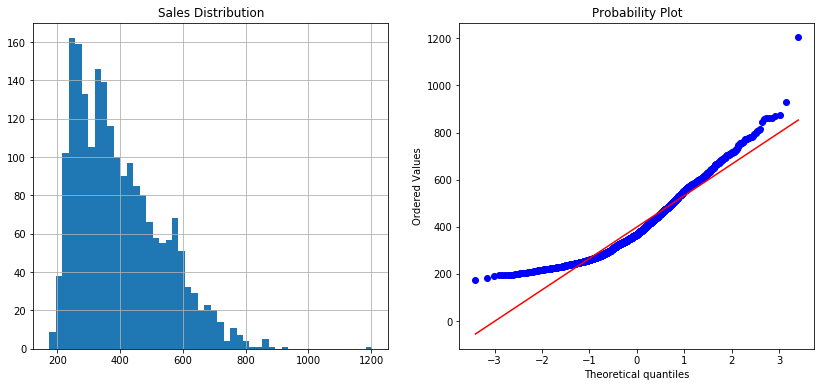

In [72]:
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
G2['Umsatz'].hist(bins=50)
plt.title('Sales Distribution')
plt.subplot(1,2,2)
stats.probplot(G2['Umsatz'], plot=plt);
G2.describe().T

,count,mean,std,min,25%,50%,75%,max
Umsatz,2090.0,164.262297,75.408444,37.7,106.6,143.6,204.525,565.9
Bewoelkung,2090.0,4.697129,2.657151,0.0,2.0,6.0,7.000,8.0
Temperatur,2090.0,11.984067,7.191955,-8.5,6.2,11.6,17.800,32.7
Windgeschwindigkeit,2090.0,11.038756,4.140187,3.0,8.0,10.0,13.000,35.0
KielerWoche,2090.0,0.021531,0.145181,0.0,0.0,0.0,0.000,1.0
year,2090.0,2015.931100,1.756078,2013.0,2014.0,2016.0,2017.000,2019.0
quarter,2090.0,2.500000,1.120440,1.0,1.0,3.0,3.000,4.0
month,2090.0,6.481818,3.457034,1.0,3.0,7.0,9.000,12.0
day,2090.0,15.792344,8.752374,1.0,8.0,16.0,23.000,31.0
weekday,2090.0,0.714833,0.451602,0.0,0.0,1.0,1.000,1.0


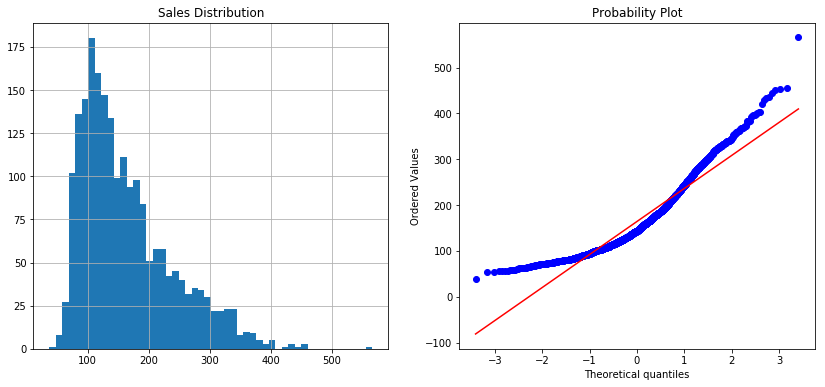

In [73]:
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
G3['Umsatz'].hist(bins=50)
plt.title('Sales Distribution')
plt.subplot(1,2,2)
stats.probplot(G3['Umsatz'], plot=plt);
G3.describe().T

,count,mean,std,min,25%,50%,75%,max
Umsatz,2036.0,87.403094,34.338679,27.4,66.2,79.9,97.425,430.5
Bewoelkung,2036.0,4.697446,2.666530,0.0,2.0,6.0,7.000,8.0
Temperatur,2036.0,11.944253,7.181773,-8.5,6.2,11.6,17.800,32.7
Windgeschwindigkeit,2036.0,11.020629,4.139053,3.0,8.0,10.0,13.000,35.0
KielerWoche,2036.0,0.021120,0.143819,0.0,0.0,0.0,0.000,1.0
year,2036.0,2015.979371,1.745635,2013.0,2015.0,2016.0,2017.000,2019.0
quarter,2036.0,2.483301,1.122132,1.0,1.0,2.0,3.000,4.0
month,2036.0,6.426326,3.453442,1.0,3.0,6.0,9.000,12.0
day,2036.0,15.687132,8.705718,1.0,8.0,16.0,23.000,31.0
weekday,2036.0,0.712181,0.452858,0.0,0.0,1.0,1.000,1.0


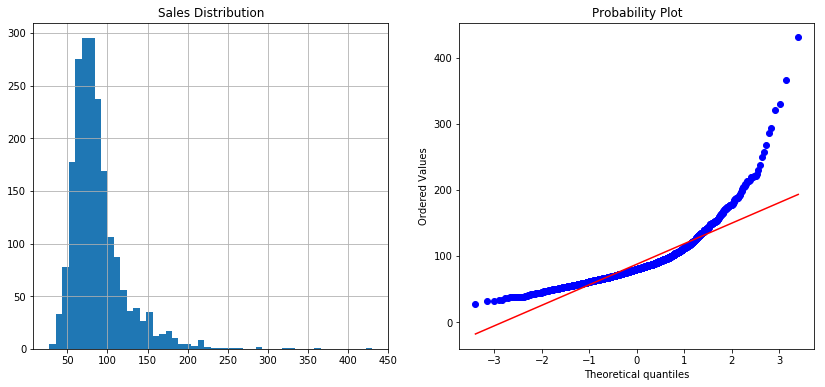

In [74]:
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
G4['Umsatz'].hist(bins=50)
plt.title('Sales Distribution')
plt.subplot(1,2,2)
stats.probplot(G4['Umsatz'], plot=plt);
G4.describe().T

,count,mean,std,min,25%,50%,75%,max
Umsatz,2090.0,278.326555,99.502916,121.5,231.4,268.35,308.7,1879.5
Bewoelkung,2090.0,4.697129,2.657151,0.0,2.0,6.00,7.0,8.0
Temperatur,2090.0,11.984067,7.191955,-8.5,6.2,11.60,17.8,32.7
Windgeschwindigkeit,2090.0,11.038756,4.140187,3.0,8.0,10.00,13.0,35.0
KielerWoche,2090.0,0.021531,0.145181,0.0,0.0,0.00,0.0,1.0
year,2090.0,2015.931100,1.756078,2013.0,2014.0,2016.00,2017.0,2019.0
quarter,2090.0,2.500000,1.120440,1.0,1.0,3.00,3.0,4.0
month,2090.0,6.481818,3.457034,1.0,3.0,7.00,9.0,12.0
day,2090.0,15.792344,8.752374,1.0,8.0,16.00,23.0,31.0
weekday,2090.0,0.714833,0.451602,0.0,0.0,1.00,1.0,1.0


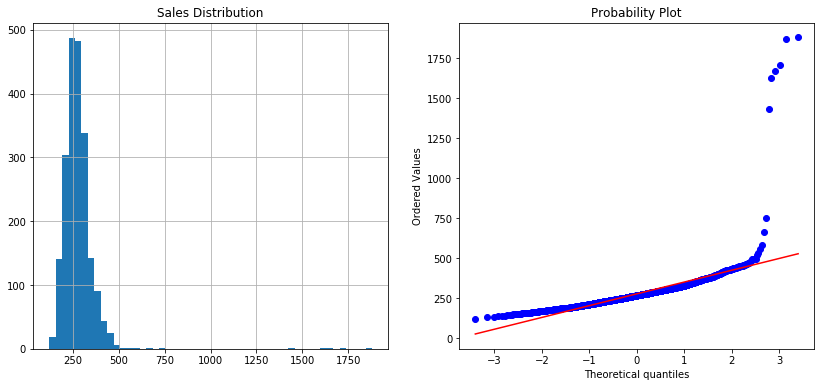

In [75]:
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
G5['Umsatz'].hist(bins=50)
plt.title('Sales Distribution')
plt.subplot(1,2,2)
stats.probplot(G5['Umsatz'], plot=plt);
G5.describe().T

,count,mean,std,min,25%,50%,75%,max
Umsatz,338.0,67.859763,32.015524,7.1,43.425,63.55,87.025,172.9
Bewoelkung,338.0,5.807692,2.231751,0.0,5.000,7.00,7.000,8.0
Temperatur,338.0,6.576923,3.477601,-3.0,4.500,6.20,8.900,16.8
Windgeschwindigkeit,338.0,10.254438,4.227969,3.0,7.000,10.00,12.000,25.0
KielerWoche,338.0,0.000000,0.000000,0.0,0.000,0.00,0.000,0.0
year,338.0,2015.363905,1.736533,2013.0,2014.000,2015.00,2017.000,2018.0
quarter,338.0,3.946746,0.396728,1.0,4.000,4.00,4.000,4.0
month,338.0,11.254438,1.489945,1.0,11.000,11.00,12.000,12.0
day,338.0,15.508876,8.608614,1.0,8.000,15.00,23.000,31.0
weekday,338.0,0.715976,0.451617,0.0,0.000,1.00,1.000,1.0


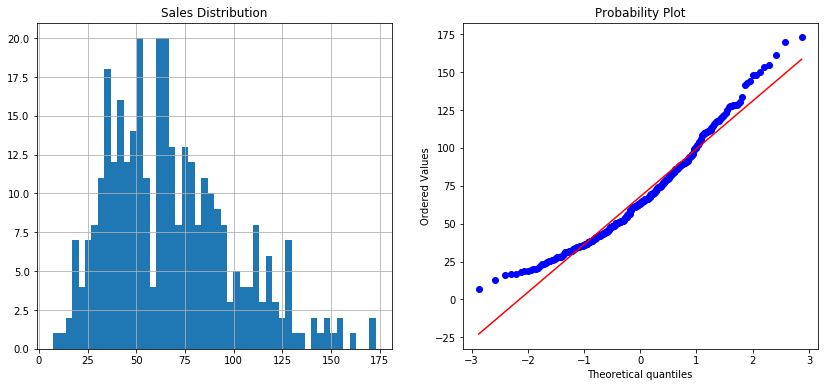

In [76]:
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
G6['Umsatz'].hist(bins=50)
plt.title('Sales Distribution')
plt.subplot(1,2,2)
stats.probplot(G6['Umsatz'], plot=plt);
G6.describe().T

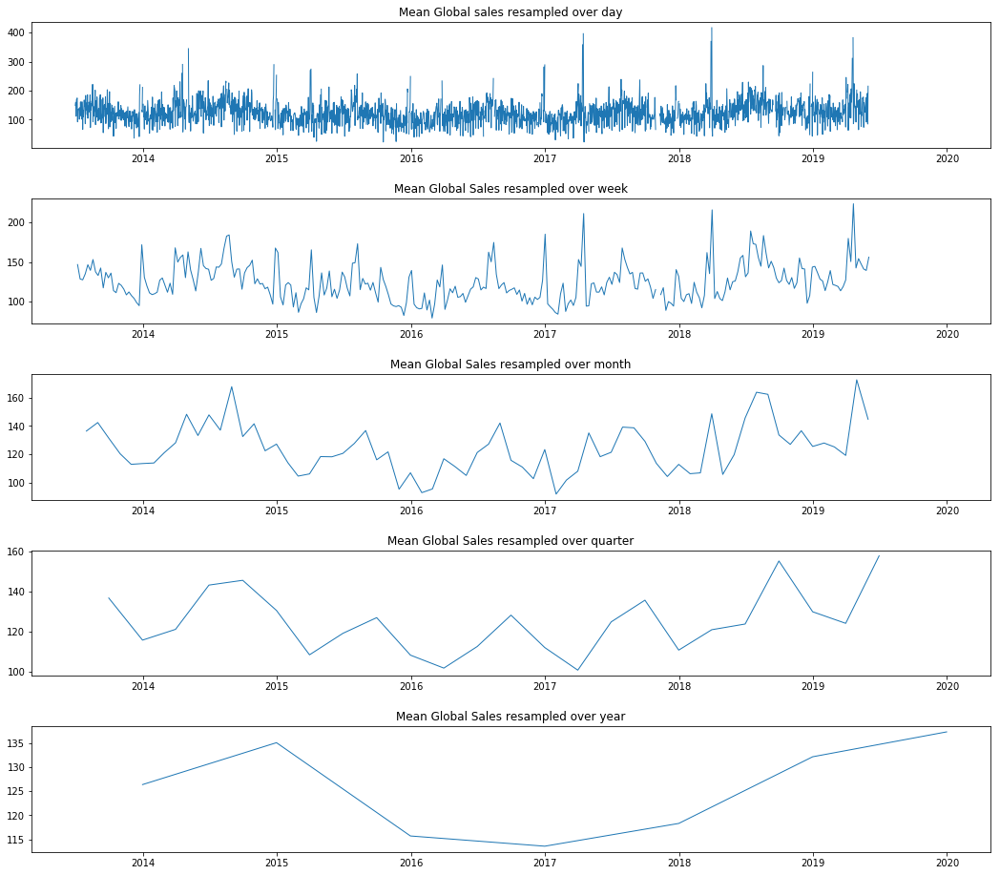

In [77]:
fig = plt.figure(figsize=(18,16))
fig.subplots_adjust(hspace=.4)
ax1 = fig.add_subplot(5,1,1)
ax1.plot(G1['Umsatz'].resample('D').mean(),linewidth=1)
ax1.set_title('Mean Global sales resampled over day')
ax1.tick_params(axis='both', which='major')

ax2 = fig.add_subplot(5,1,2, sharex=ax1)
ax2.plot(G1['Umsatz'].resample('W').mean(),linewidth=1)
ax2.set_title('Mean Global Sales resampled over week')
ax2.tick_params(axis='both', which='major')

ax3 = fig.add_subplot(5,1,3, sharex=ax1)
ax3.plot(G1['Umsatz'].resample('M').mean(),linewidth=1)
ax3.set_title('Mean Global Sales resampled over month')
ax3.tick_params(axis='both', which='major')

ax4  = fig.add_subplot(5,1,4, sharex=ax1)
ax4.plot(G1['Umsatz'].resample('Q').mean(),linewidth=1)
ax4.set_title('Mean Global Sales resampled over quarter')
ax4.tick_params(axis='both', which='major')

ax5  = fig.add_subplot(5,1,5, sharex=ax1)
ax5.plot(G1['Umsatz'].resample('A').mean(),linewidth=1)
ax5.set_title('Mean Global Sales resampled over year')
ax5.tick_params(axis='both', which='major');

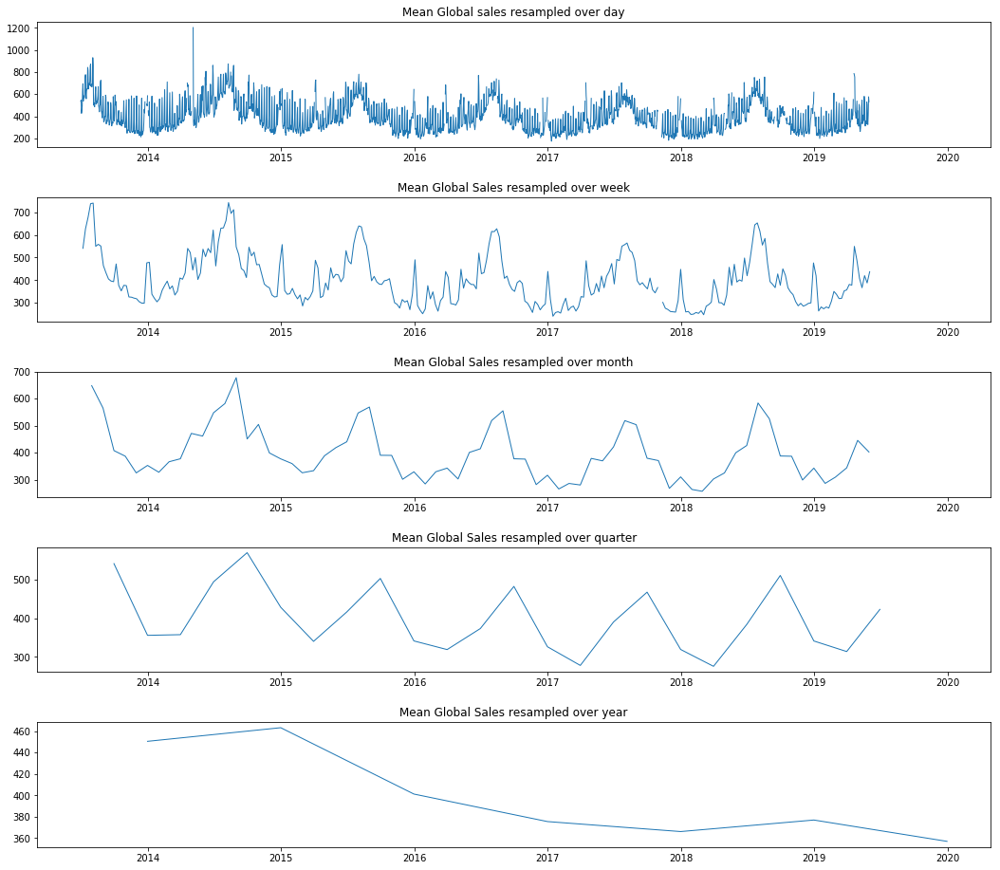

In [78]:
fig = plt.figure(figsize=(18,16))
fig.subplots_adjust(hspace=.4)
ax1 = fig.add_subplot(5,1,1)
ax1.plot(G2['Umsatz'].resample('D').mean(),linewidth=1)
ax1.set_title('Mean Global sales resampled over day')
ax1.tick_params(axis='both', which='major')

ax2 = fig.add_subplot(5,1,2, sharex=ax1)
ax2.plot(G2['Umsatz'].resample('W').mean(),linewidth=1)
ax2.set_title('Mean Global Sales resampled over week')
ax2.tick_params(axis='both', which='major')

ax3 = fig.add_subplot(5,1,3, sharex=ax1)
ax3.plot(G2['Umsatz'].resample('M').mean(),linewidth=1)
ax3.set_title('Mean Global Sales resampled over month')
ax3.tick_params(axis='both', which='major')

ax4  = fig.add_subplot(5,1,4, sharex=ax1)
ax4.plot(G2['Umsatz'].resample('Q').mean(),linewidth=1)
ax4.set_title('Mean Global Sales resampled over quarter')
ax4.tick_params(axis='both', which='major')

ax5  = fig.add_subplot(5,1,5, sharex=ax1)
ax5.plot(G2['Umsatz'].resample('A').mean(),linewidth=1)
ax5.set_title('Mean Global Sales resampled over year')
ax5.tick_params(axis='both', which='major');

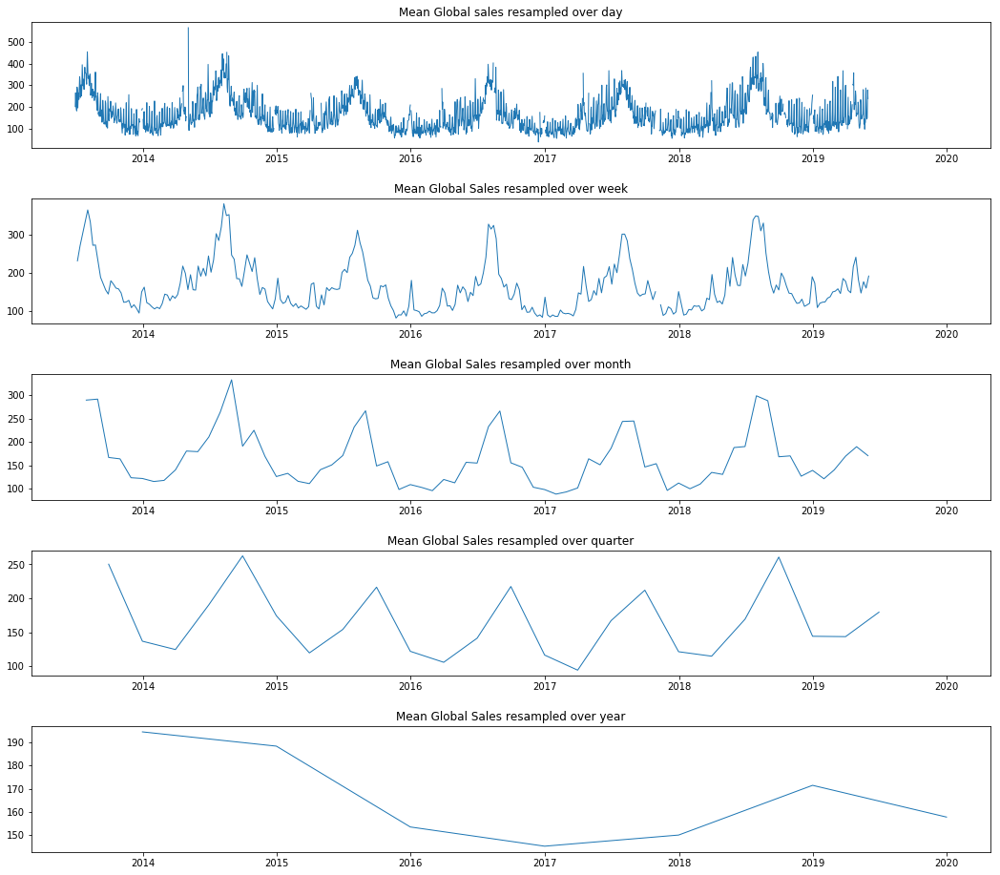

In [79]:
fig = plt.figure(figsize=(18,16))
fig.subplots_adjust(hspace=.4)
ax1 = fig.add_subplot(5,1,1)
ax1.plot(G3['Umsatz'].resample('D').mean(),linewidth=1)
ax1.set_title('Mean Global sales resampled over day')
ax1.tick_params(axis='both', which='major')

ax2 = fig.add_subplot(5,1,2, sharex=ax1)
ax2.plot(G3['Umsatz'].resample('W').mean(),linewidth=1)
ax2.set_title('Mean Global Sales resampled over week')
ax2.tick_params(axis='both', which='major')

ax3 = fig.add_subplot(5,1,3, sharex=ax1)
ax3.plot(G3['Umsatz'].resample('M').mean(),linewidth=1)
ax3.set_title('Mean Global Sales resampled over month')
ax3.tick_params(axis='both', which='major')

ax4  = fig.add_subplot(5,1,4, sharex=ax1)
ax4.plot(G3['Umsatz'].resample('Q').mean(),linewidth=1)
ax4.set_title('Mean Global Sales resampled over quarter')
ax4.tick_params(axis='both', which='major')

ax5  = fig.add_subplot(5,1,5, sharex=ax1)
ax5.plot(G3['Umsatz'].resample('A').mean(),linewidth=1)
ax5.set_title('Mean Global Sales resampled over year')
ax5.tick_params(axis='both', which='major');

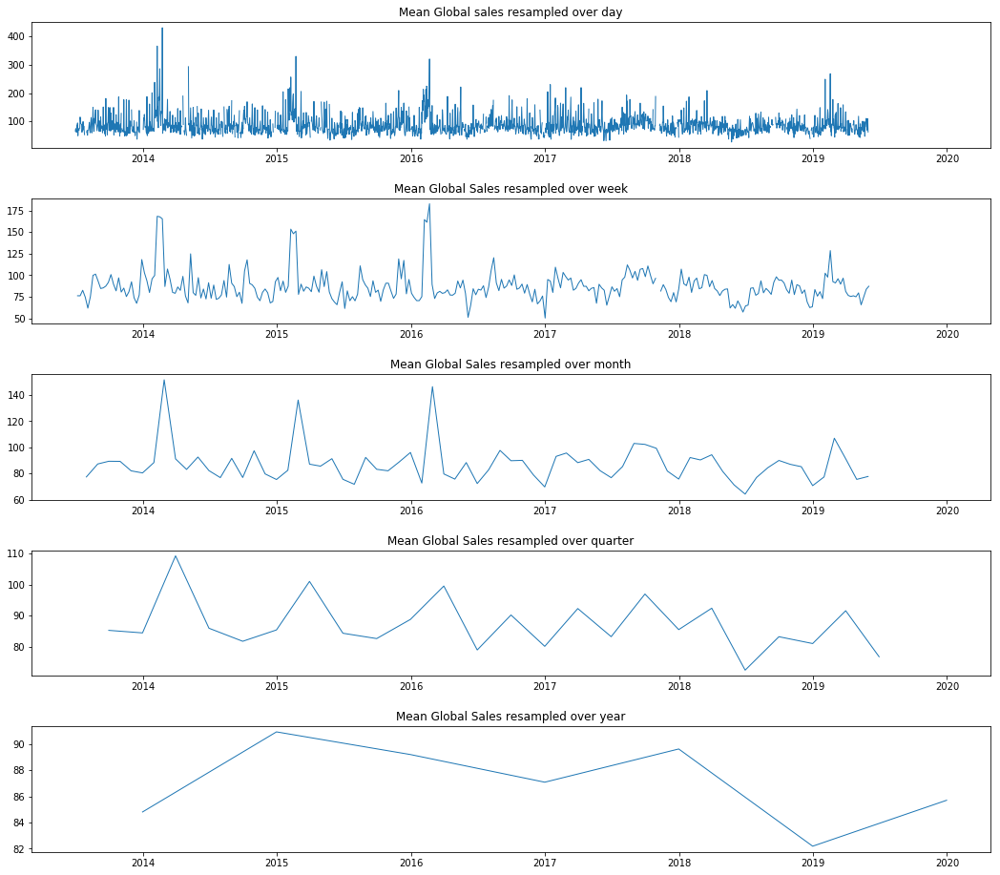

In [80]:
fig = plt.figure(figsize=(18,16))
fig.subplots_adjust(hspace=.4)
ax1 = fig.add_subplot(5,1,1)
ax1.plot(G4['Umsatz'].resample('D').mean(),linewidth=1)
ax1.set_title('Mean Global sales resampled over day')
ax1.tick_params(axis='both', which='major')

ax2 = fig.add_subplot(5,1,2, sharex=ax1)
ax2.plot(G4['Umsatz'].resample('W').mean(),linewidth=1)
ax2.set_title('Mean Global Sales resampled over week')
ax2.tick_params(axis='both', which='major')

ax3 = fig.add_subplot(5,1,3, sharex=ax1)
ax3.plot(G4['Umsatz'].resample('M').mean(),linewidth=1)
ax3.set_title('Mean Global Sales resampled over month')
ax3.tick_params(axis='both', which='major')

ax4  = fig.add_subplot(5,1,4, sharex=ax1)
ax4.plot(G4['Umsatz'].resample('Q').mean(),linewidth=1)
ax4.set_title('Mean Global Sales resampled over quarter')
ax4.tick_params(axis='both', which='major')

ax5  = fig.add_subplot(5,1,5, sharex=ax1)
ax5.plot(G4['Umsatz'].resample('A').mean(),linewidth=1)
ax5.set_title('Mean Global Sales resampled over year')
ax5.tick_params(axis='both', which='major');

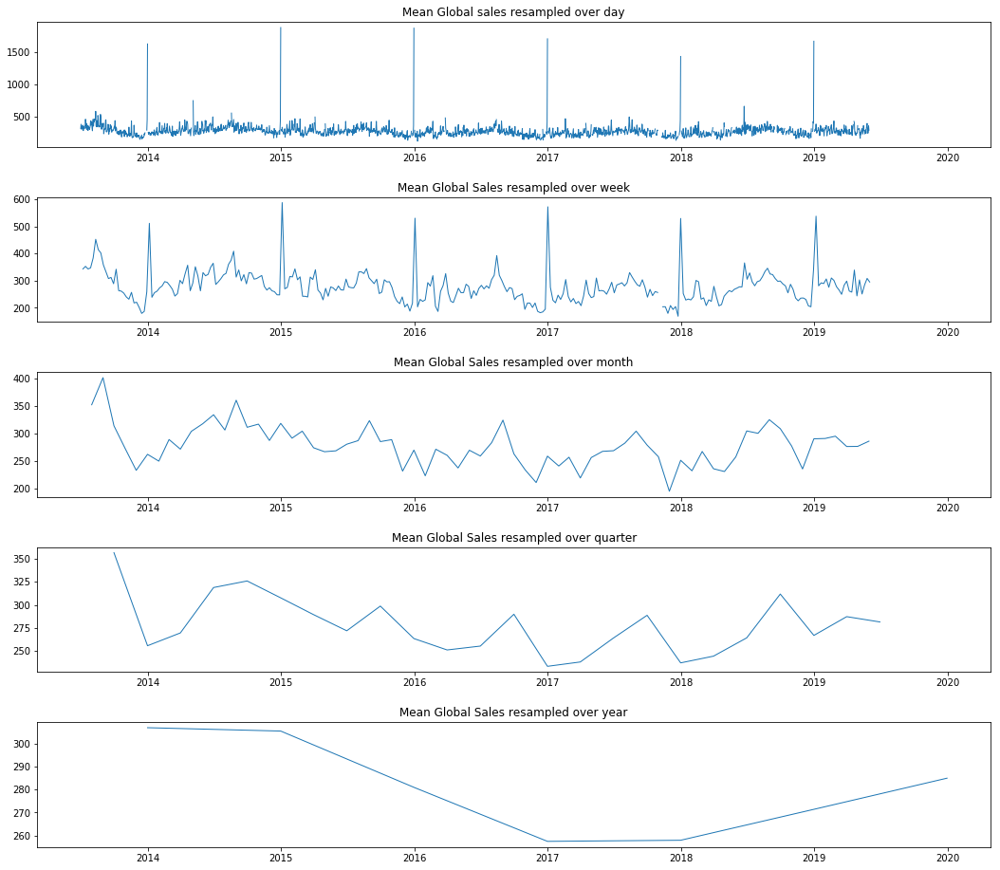

In [81]:
fig = plt.figure(figsize=(18,16))
fig.subplots_adjust(hspace=.4)
ax1 = fig.add_subplot(5,1,1)
ax1.plot(G5['Umsatz'].resample('D').mean(),linewidth=1)
ax1.set_title('Mean Global sales resampled over day')
ax1.tick_params(axis='both', which='major')

ax2 = fig.add_subplot(5,1,2, sharex=ax1)
ax2.plot(G5['Umsatz'].resample('W').mean(),linewidth=1)
ax2.set_title('Mean Global Sales resampled over week')
ax2.tick_params(axis='both', which='major')

ax3 = fig.add_subplot(5,1,3, sharex=ax1)
ax3.plot(G5['Umsatz'].resample('M').mean(),linewidth=1)
ax3.set_title('Mean Global Sales resampled over month')
ax3.tick_params(axis='both', which='major')

ax4  = fig.add_subplot(5,1,4, sharex=ax1)
ax4.plot(G5['Umsatz'].resample('Q').mean(),linewidth=1)
ax4.set_title('Mean Global Sales resampled over quarter')
ax4.tick_params(axis='both', which='major')

ax5  = fig.add_subplot(5,1,5, sharex=ax1)
ax5.plot(G5['Umsatz'].resample('A').mean(),linewidth=1)
ax5.set_title('Mean Global Sales resampled over year')
ax5.tick_params(axis='both', which='major');

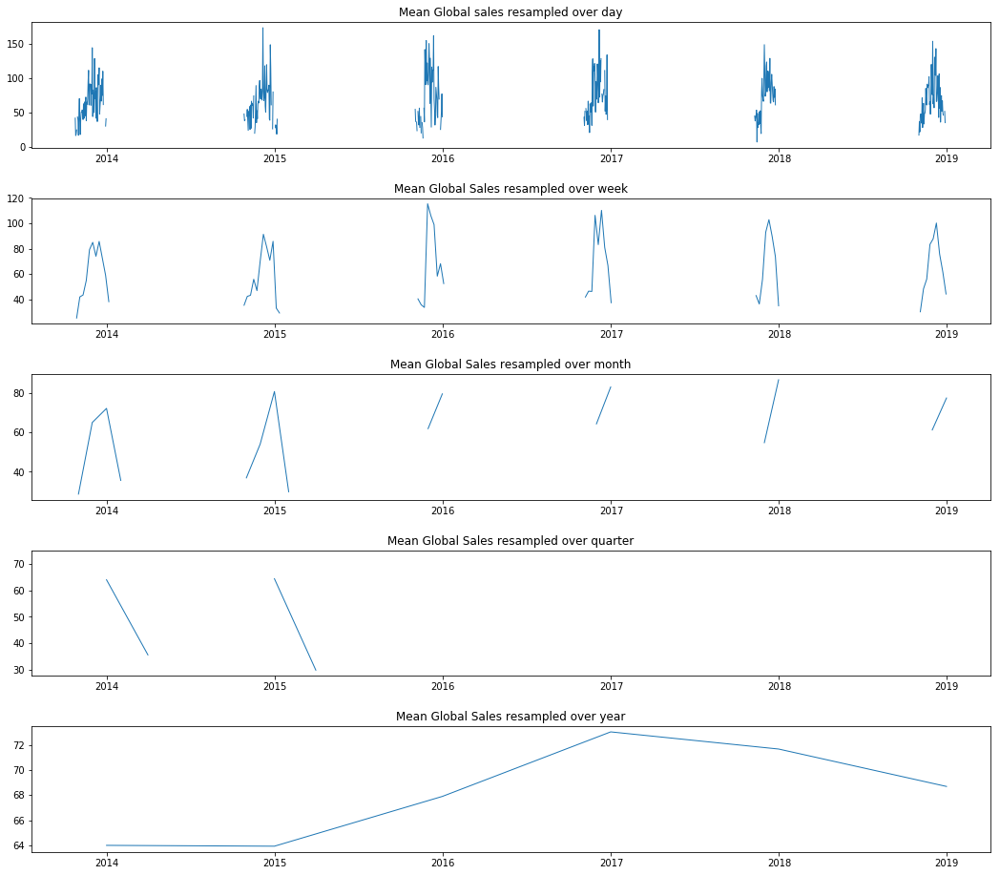

In [82]:
fig = plt.figure(figsize=(18,16))
fig.subplots_adjust(hspace=.4)
ax1 = fig.add_subplot(5,1,1)
ax1.plot(G6['Umsatz'].resample('D').mean(),linewidth=1)
ax1.set_title('Mean Global sales resampled over day')
ax1.tick_params(axis='both', which='major')

ax2 = fig.add_subplot(5,1,2, sharex=ax1)
ax2.plot(G6['Umsatz'].resample('W').mean(),linewidth=1)
ax2.set_title('Mean Global Sales resampled over week')
ax2.tick_params(axis='both', which='major')

ax3 = fig.add_subplot(5,1,3, sharex=ax1)
ax3.plot(G6['Umsatz'].resample('M').mean(),linewidth=1)
ax3.set_title('Mean Global Sales resampled over month')
ax3.tick_params(axis='both', which='major')

ax4  = fig.add_subplot(5,1,4, sharex=ax1)
ax4.plot(G6['Umsatz'].resample('Q').mean(),linewidth=1)
ax4.set_title('Mean Global Sales resampled over quarter')
ax4.tick_params(axis='both', which='major')

ax5  = fig.add_subplot(5,1,5, sharex=ax1)
ax5.plot(G6['Umsatz'].resample('A').mean(),linewidth=1)
ax5.set_title('Mean Global Sales resampled over year')
ax5.tick_params(axis='both', which='major');

Text(0.5, 1.0, 'Mean Sales by Day')

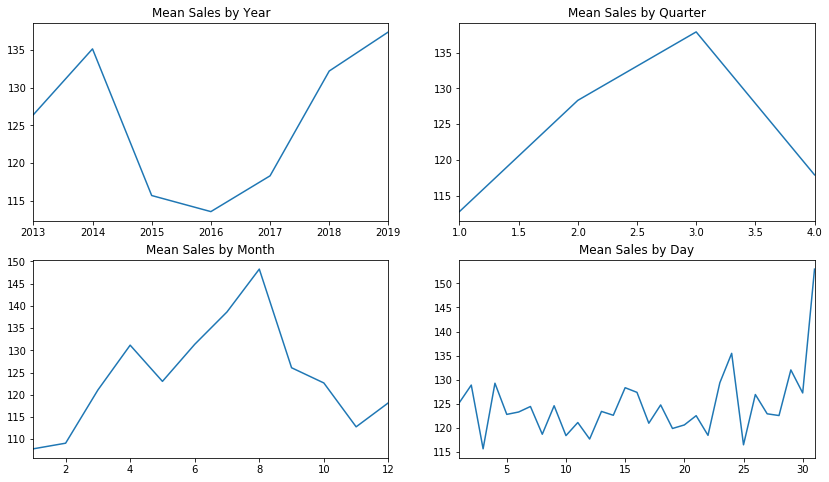

In [83]:
plt.figure(figsize=(14,8))
plt.subplot(2,2,1)
G1.groupby('year').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Year')

plt.subplot(2,2,2)
G1.groupby('quarter').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Quarter')

plt.subplot(2,2,3)
G1.groupby('month').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Month')

plt.subplot(2,2,4)
G1.groupby('day').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Day')

Text(0.5, 1.0, 'Mean Sales by Day')

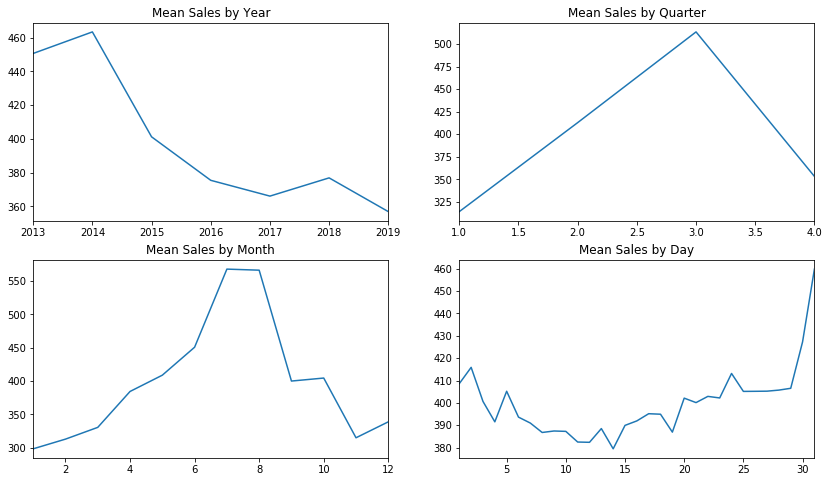

In [84]:
plt.figure(figsize=(14,8))
plt.subplot(2,2,1)
G2.groupby('year').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Year')

plt.subplot(2,2,2)
G2.groupby('quarter').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Quarter')

plt.subplot(2,2,3)
G2.groupby('month').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Month')

plt.subplot(2,2,4)
G2.groupby('day').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Day')

Text(0.5, 1.0, 'Mean Sales by Day')

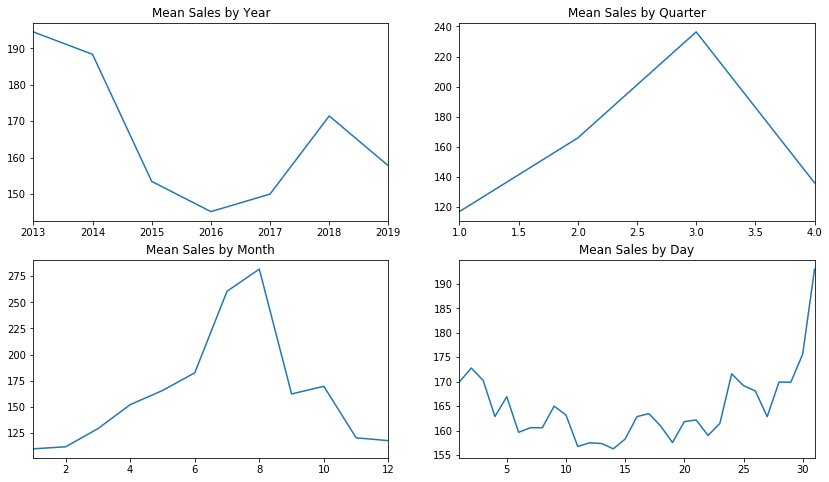

In [85]:
plt.figure(figsize=(14,8))
plt.subplot(2,2,1)
G3.groupby('year').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Year')

plt.subplot(2,2,2)
G3.groupby('quarter').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Quarter')

plt.subplot(2,2,3)
G3.groupby('month').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Month')

plt.subplot(2,2,4)
G3.groupby('day').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Day')

Text(0.5, 1.0, 'Mean Sales by Day')

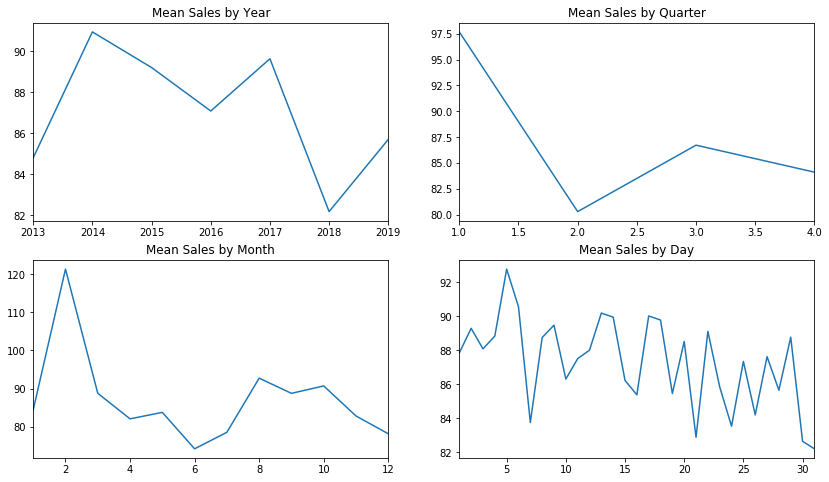

In [86]:
plt.figure(figsize=(14,8))
plt.subplot(2,2,1)
G4.groupby('year').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Year')

plt.subplot(2,2,2)
G4.groupby('quarter').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Quarter')

plt.subplot(2,2,3)
G4.groupby('month').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Month')

plt.subplot(2,2,4)
G4.groupby('day').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Day')

Text(0.5, 1.0, 'Mean Sales by Day')

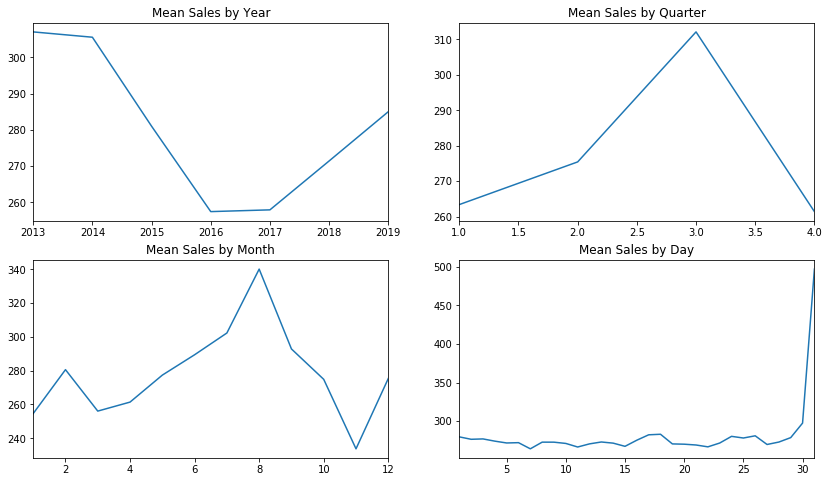

In [87]:
plt.figure(figsize=(14,8))
plt.subplot(2,2,1)
G5.groupby('year').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Year')

plt.subplot(2,2,2)
G5.groupby('quarter').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Quarter')

plt.subplot(2,2,3)
G5.groupby('month').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Month')

plt.subplot(2,2,4)
G5.groupby('day').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Day')

Text(0.5, 1.0, 'Mean Sales by Day')

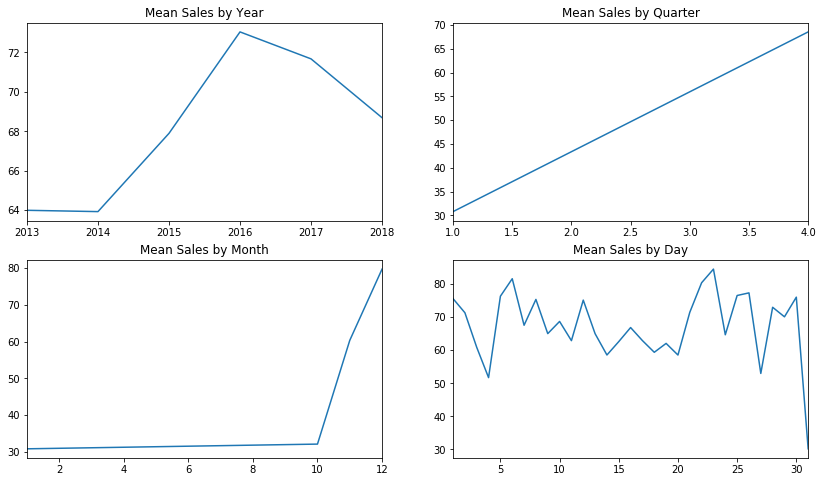

In [88]:
plt.figure(figsize=(14,8))
plt.subplot(2,2,1)
G6.groupby('year').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Year')

plt.subplot(2,2,2)
G6.groupby('quarter').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Quarter')

plt.subplot(2,2,3)
G6.groupby('month').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Month')

plt.subplot(2,2,4)
G6.groupby('day').Umsatz.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Sales by Day')

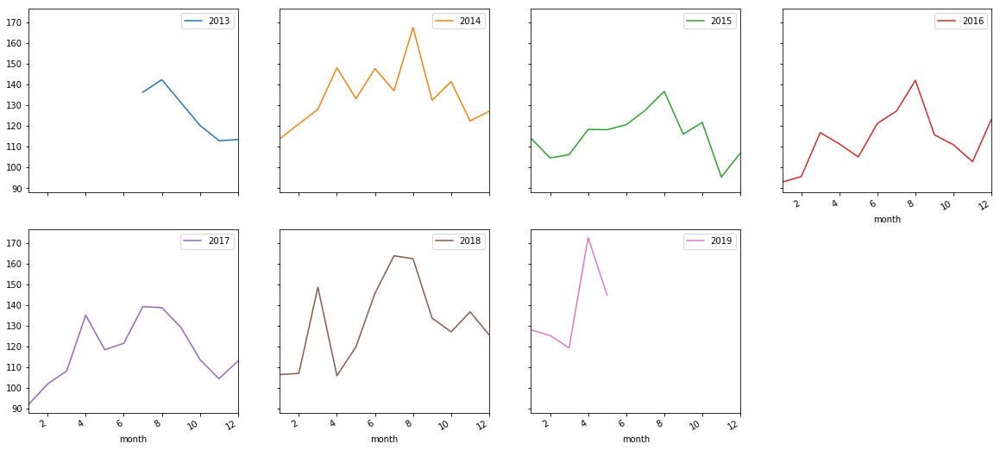

In [89]:
pd.pivot_table(G1, values = "Umsatz", 
               columns = "year", index = "month").plot(subplots = True, figsize=(20, 20), layout=(4, 4), sharey=True);

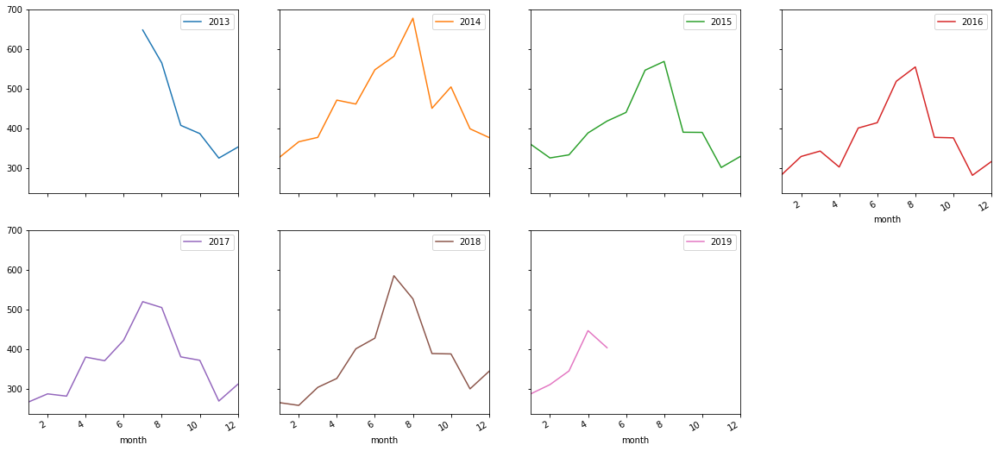

In [90]:
pd.pivot_table(G2, values = "Umsatz", 
               columns = "year", index = "month").plot(subplots = True, figsize=(20, 20), layout=(4, 4), sharey=True);

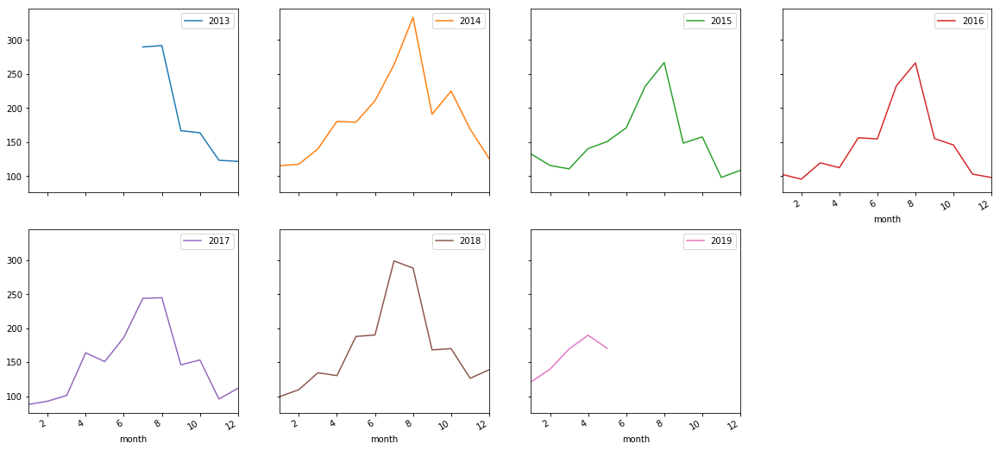

In [91]:
pd.pivot_table(G3, values = "Umsatz", 
               columns = "year", index = "month").plot(subplots = True, figsize=(20, 20), layout=(4, 4), sharey=True);

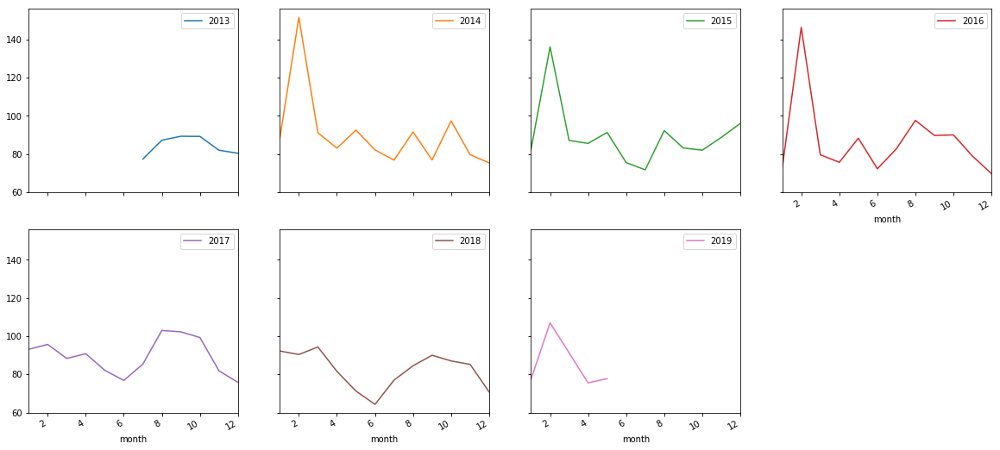

In [92]:
pd.pivot_table(G4, values = "Umsatz", 
               columns = "year", index = "month").plot(subplots = True, figsize=(20, 20), layout=(4, 4), sharey=True);

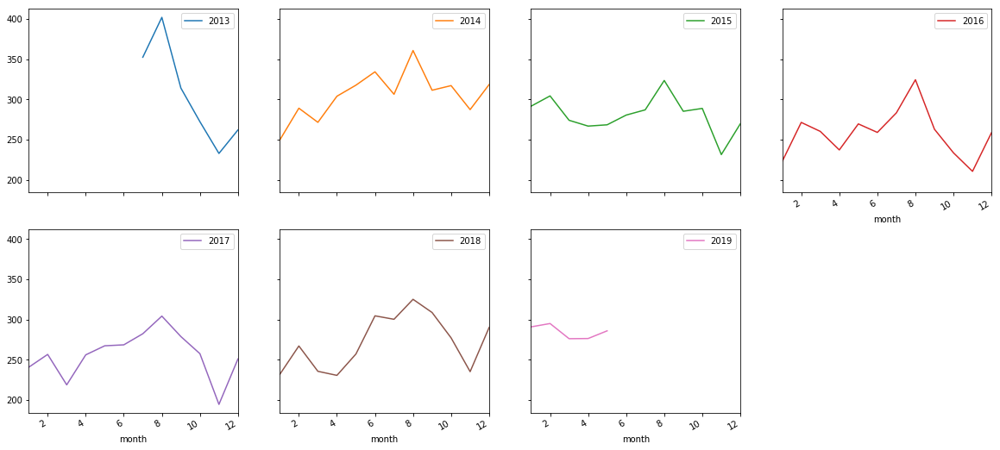

In [93]:
pd.pivot_table(G5, values = "Umsatz", 
               columns = "year", index = "month").plot(subplots = True, figsize=(20, 20), layout=(4, 4), sharey=True);

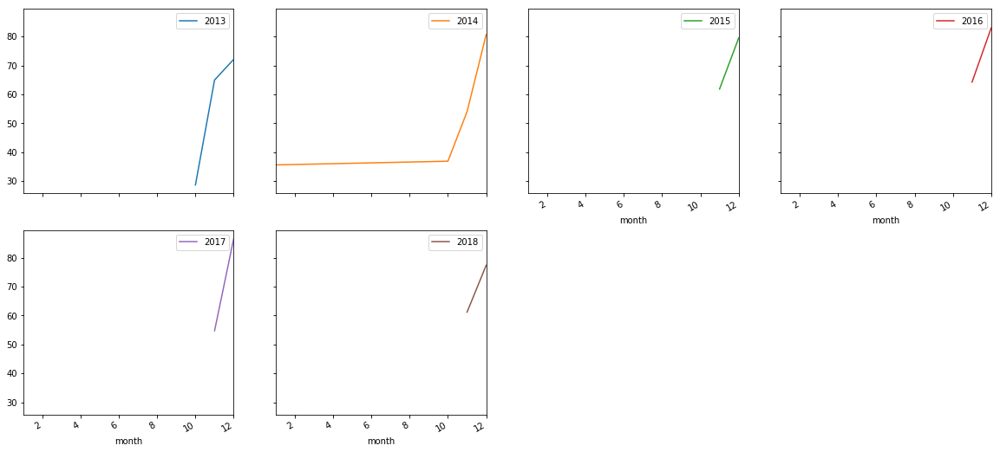

In [94]:
pd.pivot_table(G6, values = "Umsatz", 
               columns = "year", index = "month").plot(subplots = True, figsize=(20, 20), layout=(4, 4), sharey=True);

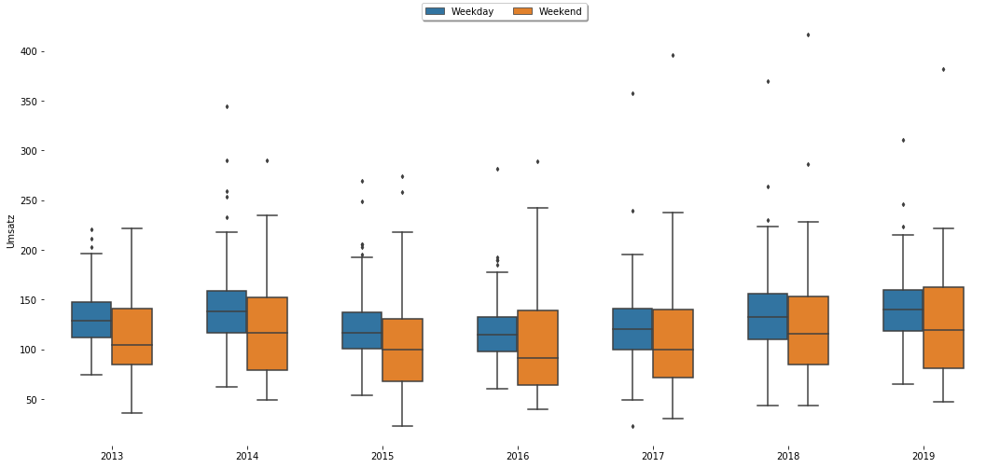

In [95]:
dic={0:'Weekend',1:'Weekday'}
G1['Day'] = G1.weekday.map(dic)
a=plt.figure(figsize=(15,7)) 
plt1=sns.boxplot('year','Umsatz',hue='Day',width=0.6,fliersize=3,
                    data=G1)                                                                                                                                                                                                                                                                                                                                                 
a.legend(loc='upper center', bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
sns.despine(left=True, bottom=True) 
plt.xlabel('')
plt.tight_layout()                                                                                                                  
plt.legend().set_visible(False);

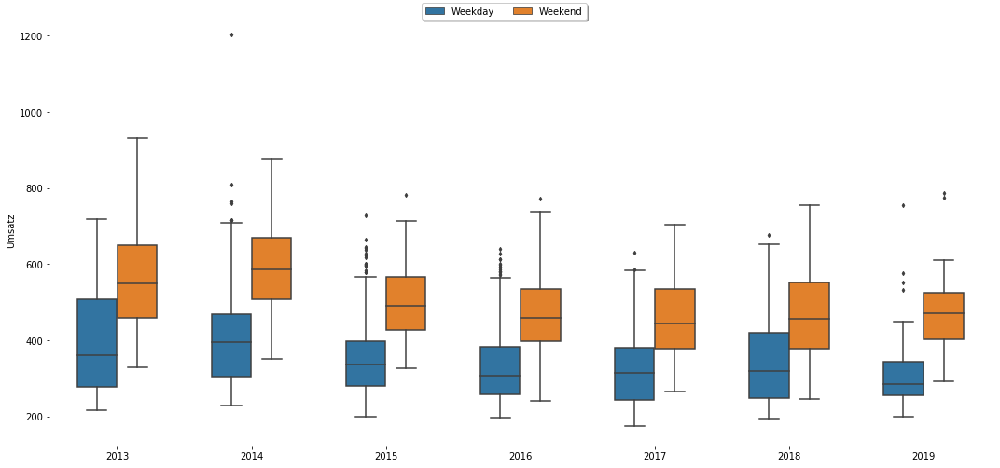

In [96]:
dic={0:'Weekend',1:'Weekday'}
G2['Day'] = G2.weekday.map(dic)
a=plt.figure(figsize=(15,7)) 
plt1=sns.boxplot('year','Umsatz',hue='Day',width=0.6,fliersize=3,
                    data=G2)                                                                                                                                                                                                                                                                                                                                                 
a.legend(loc='upper center', bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
sns.despine(left=True, bottom=True) 
plt.xlabel('')
plt.tight_layout()                                                                                                                  
plt.legend().set_visible(False);

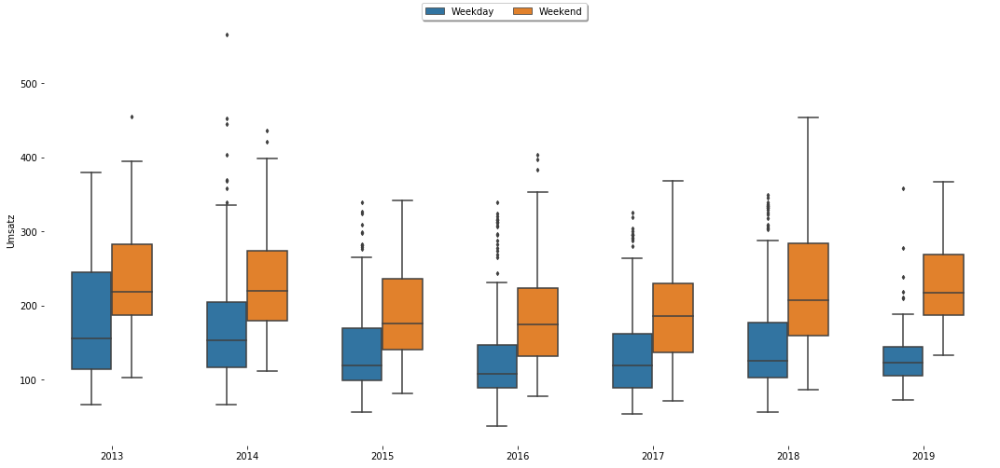

In [97]:
dic={0:'Weekend',1:'Weekday'}
G3['Day'] = G3.weekday.map(dic)
a=plt.figure(figsize=(15,7)) 
plt1=sns.boxplot('year','Umsatz',hue='Day',width=0.6,fliersize=3,
                    data=G3)                                                                                                                                                                                                                                                                                                                                                 
a.legend(loc='upper center', bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
sns.despine(left=True, bottom=True) 
plt.xlabel('')
plt.tight_layout()                                                                                                                  
plt.legend().set_visible(False);

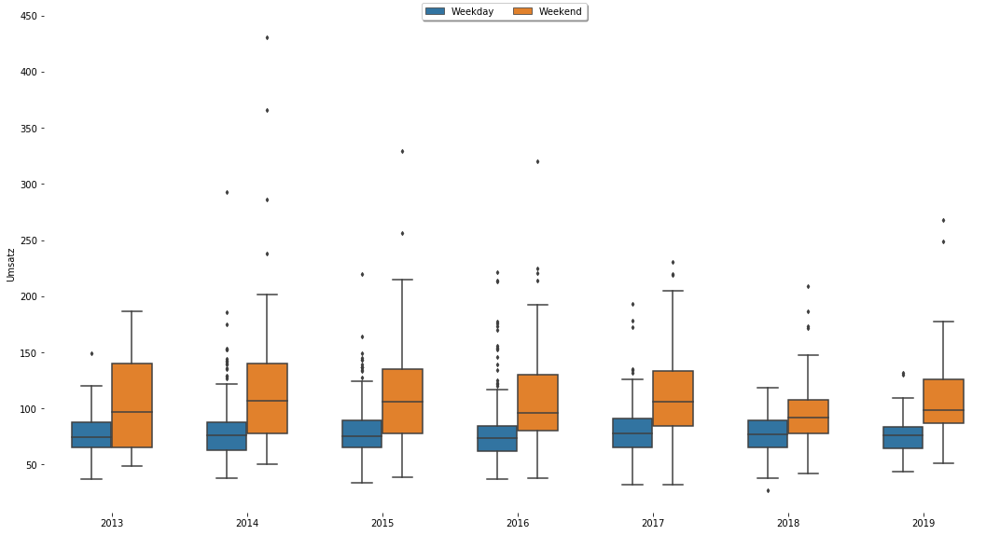

In [98]:
dic={0:'Weekend',1:'Weekday'}
G4['Day'] = G4.weekday.map(dic)
a=plt.figure(figsize=(15,8)) 
plt1=sns.boxplot('year','Umsatz',hue='Day',width=0.6,fliersize=3,
                    data=G4)                                                                                                                                                                                                                                                                                                                                                 
a.legend(loc='upper center', bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
sns.despine(left=True, bottom=True) 
plt.xlabel('')
plt.tight_layout()                                                                                                                  
plt.legend().set_visible(False);

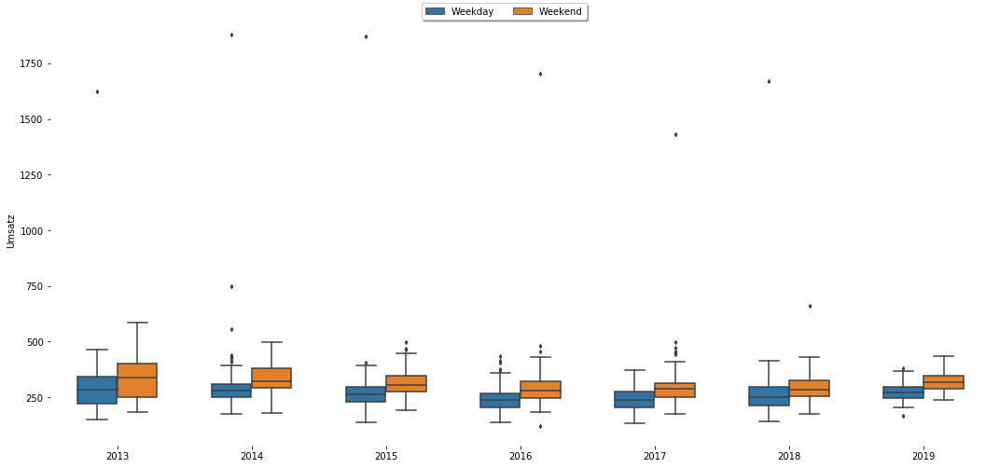

In [99]:
dic={0:'Weekend',1:'Weekday'}
G5['Day'] = G5.weekday.map(dic)
a=plt.figure(figsize=(15,7)) 
plt1=sns.boxplot('year','Umsatz',hue='Day',width=0.6,fliersize=3,
                    data=G5)                                                                                                                                                                                                                                                                                                                                                 
a.legend(loc='upper center', bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
sns.despine(left=True, bottom=True) 
plt.xlabel('')
plt.tight_layout()                                                                                                                  
plt.legend().set_visible(False);

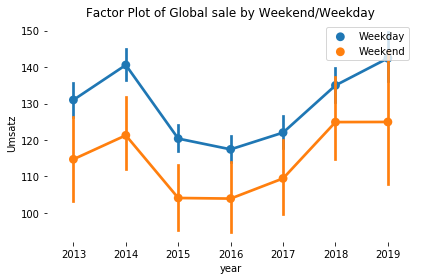

In [100]:
plt1=sns.factorplot('year','Umsatz',hue='Day',
                    data=G1, size=4, aspect=1.5, legend=False)                                                                                                                                                                                                                                                                                                                                             
plt.title('Factor Plot of Global sale by Weekend/Weekday')                                                             
plt.tight_layout()                                                                                                                  
sns.despine(left=True, bottom=True) 
plt.legend(loc='upper right');

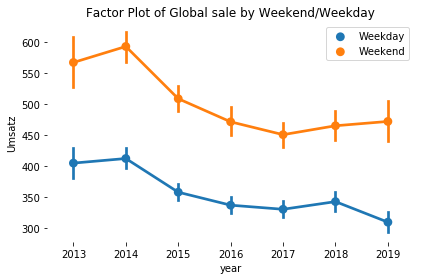

In [101]:
plt1=sns.factorplot('year','Umsatz',hue='Day',
                    data=G2, size=4, aspect=1.5, legend=False)                                                                                                                                                                                                                                                                                                                                             
plt.title('Factor Plot of Global sale by Weekend/Weekday')                                                             
plt.tight_layout()                                                                                                                  
sns.despine(left=True, bottom=True) 
plt.legend(loc='upper right');

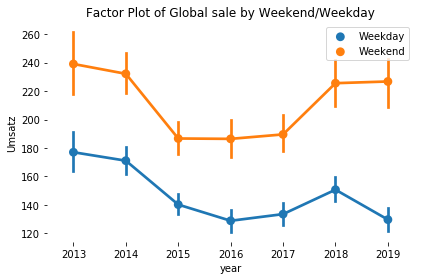

In [102]:
plt1=sns.factorplot('year','Umsatz',hue='Day',
                    data=G3, size=4, aspect=1.5, legend=False)                                                                                                                                                                                                                                                                                                                                             
plt.title('Factor Plot of Global sale by Weekend/Weekday')                                                             
plt.tight_layout()                                                                                                                  
sns.despine(left=True, bottom=True) 
plt.legend(loc='upper right');

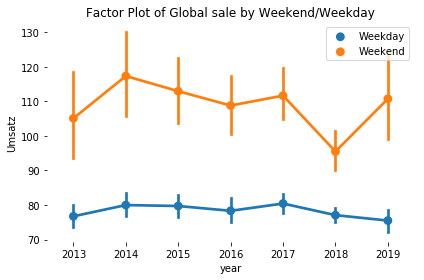

In [103]:
plt1=sns.factorplot('year','Umsatz',hue='Day',
                    data=G4, size=4, aspect=1.5, legend=False)                                                                                                                                                                                                                                                                                                                                             
plt.title('Factor Plot of Global sale by Weekend/Weekday')                                                             
plt.tight_layout()                                                                                                                  
sns.despine(left=True, bottom=True) 
plt.legend(loc='upper right');

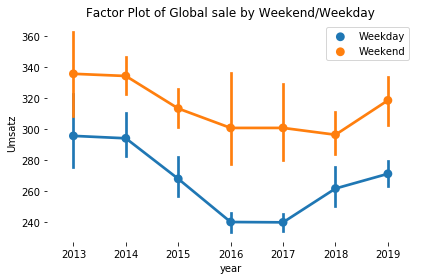

In [104]:
plt1=sns.factorplot('year','Umsatz',hue='Day',
                    data=G5, size=4, aspect=1.5, legend=False)                                                                                                                                                                                                                                                                                                                                             
plt.title('Factor Plot of Global sale by Weekend/Weekday')                                                             
plt.tight_layout()                                                                                                                  
sns.despine(left=True, bottom=True) 
plt.legend(loc='upper right');

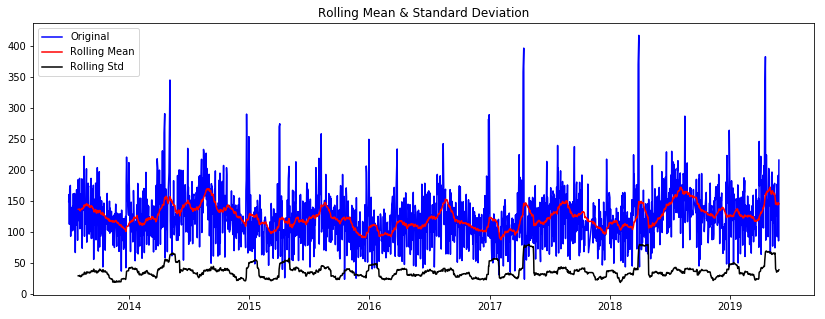

<Results of Dickey-Fuller Test>
Test Statistic                -6.016214e+00
p-value                        1.531506e-07
#Lags Used                     2.000000e+01
Number of Observations Used    2.069000e+03
Critical Value (1%)           -3.433515e+00
Critical Value (5%)           -2.862938e+00
Critical Value (10%)          -2.567514e+00
dtype: float64


In [105]:
df2=G1.resample('D', how=np.mean)

def test_stationarity(timeseries):
    rolmean = timeseries.rolling(window=30).mean()
    rolstd = timeseries.rolling(window=30).std()
    
    plt.figure(figsize=(14,5))
    sns.despine(left=True)
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')

    plt.legend(loc='best'); plt.title('Rolling Mean & Standard Deviation')
    plt.show()
    
    print ('<Results of Dickey-Fuller Test>')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4],
                         index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
test_stationarity(df2.Umsatz.dropna())

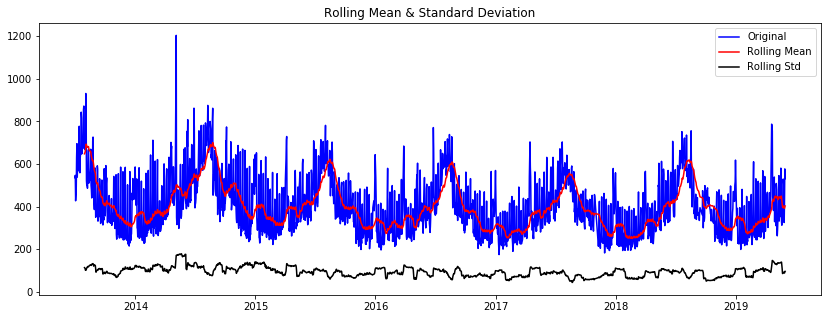

<Results of Dickey-Fuller Test>
Test Statistic                   -4.452324
p-value                           0.000240
#Lags Used                       21.000000
Number of Observations Used    2068.000000
Critical Value (1%)              -3.433516
Critical Value (5%)              -2.862939
Critical Value (10%)             -2.567515
dtype: float64


In [106]:
test_stationarity(G2.resample('D', how=np.mean).Umsatz.dropna())

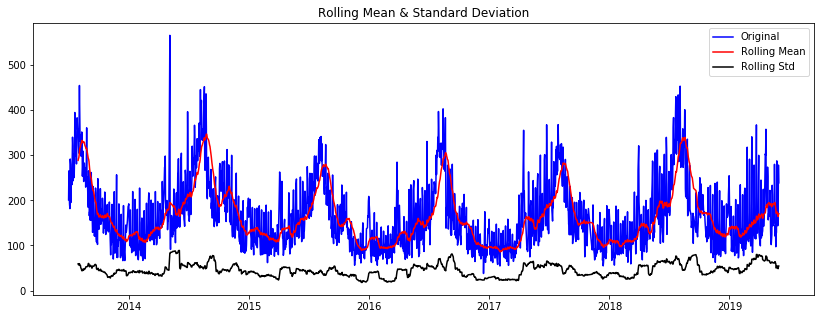

<Results of Dickey-Fuller Test>
Test Statistic                   -4.572887
p-value                           0.000145
#Lags Used                       21.000000
Number of Observations Used    2068.000000
Critical Value (1%)              -3.433516
Critical Value (5%)              -2.862939
Critical Value (10%)             -2.567515
dtype: float64


In [107]:
test_stationarity(G3.resample('D', how=np.mean).Umsatz.dropna())

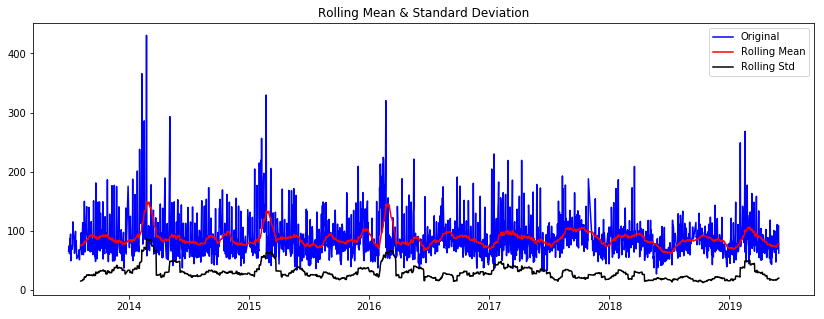

<Results of Dickey-Fuller Test>
Test Statistic                -8.053819e+00
p-value                        1.713684e-12
#Lags Used                     2.100000e+01
Number of Observations Used    2.014000e+03
Critical Value (1%)           -3.433601e+00
Critical Value (5%)           -2.862976e+00
Critical Value (10%)          -2.567535e+00
dtype: float64


In [108]:
test_stationarity(G4.resample('D', how=np.mean).Umsatz.dropna())

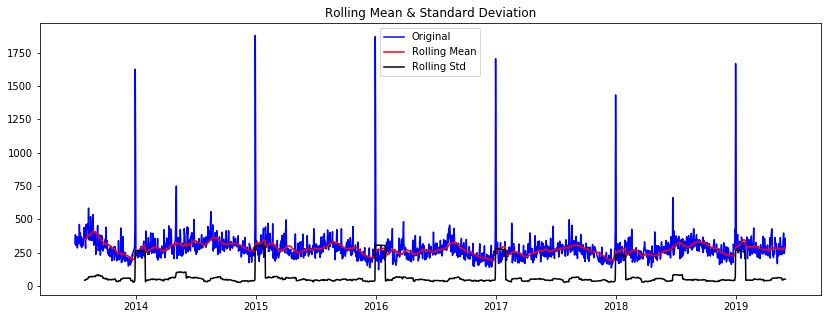

<Results of Dickey-Fuller Test>
Test Statistic                -8.129162e+00
p-value                        1.102162e-12
#Lags Used                     1.300000e+01
Number of Observations Used    2.076000e+03
Critical Value (1%)           -3.433504e+00
Critical Value (5%)           -2.862933e+00
Critical Value (10%)          -2.567512e+00
dtype: float64


In [109]:
test_stationarity(G5.resample('D', how=np.mean).Umsatz.dropna())

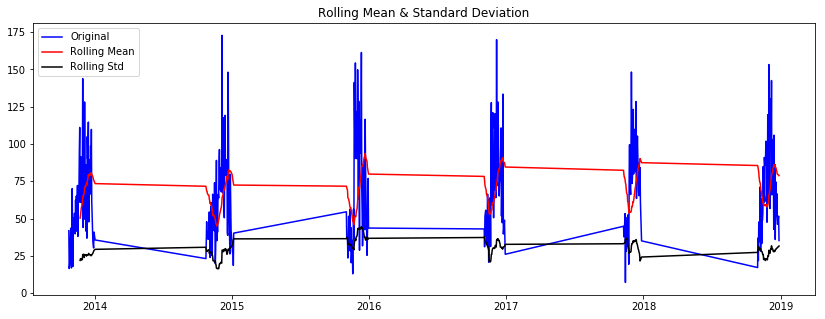

<Results of Dickey-Fuller Test>
Test Statistic                  -5.396178
p-value                          0.000003
#Lags Used                      17.000000
Number of Observations Used    320.000000
Critical Value (1%)             -3.450952
Critical Value (5%)             -2.870615
Critical Value (10%)            -2.571605
dtype: float64


In [110]:
test_stationarity(G6.resample('D', how=np.mean).Umsatz.dropna())